# Data Load Check

- Since I'm already using Databricks, I opted to analyze the data within the same environment.
- In Databricks, I don't have access to DBFS (Databricks File System), and uploading individual files is only possible via the UI. As a result, there's no need to use pd.read_csv. However, the data is ingested without column names, so they must be manually assigned in a following step.

In [0]:
%sql
use com_de_alyt_de

# Import packages

In [0]:
# import ace_tools as tools
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [0]:
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler

In [0]:
from sklearn.preprocessing import PowerTransformer

In [0]:
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, mean_squared_error

In [0]:
# %pip install package_name

In [0]:
# pip install numpy==1.20.3

# Load Data as pandas Dataframes

In [0]:
# Generate table names dynamically
table_names = [f"{prefix}_fd_{str(i).zfill(3)}" for prefix in ["test", "train", "rul"] for i in range(1, 5)]

# Dictionary to store Pandas DataFrames in databricks
pandas_dfs = {table: spark.read.table(table).toPandas() for table in table_names}

In [0]:
for table_name, df in pandas_dfs.items():
    globals()[table_name] = df

## Modify Dataframes

In [0]:
# The test and train data was loaded with 2 empty columns and without the column names
# Assign the new column names for the first 25 columns
new_column_names = [
    "unit_number", "time_in_cycles", "operational_setting_1", "operational_setting_2", "operational_setting_3"
] + [f"sensor_measurement_{i}" for i in range(1, 22)]  # Sensor measurements from 1 to 21 (total 26 columns)

# List of tables to modify
tables_to_modify = [f"{prefix}_fd_{str(i).zfill(3)}" for prefix in ["test", "train"] for i in range(1, 5)]

for table in tables_to_modify:
    df = globals()[table]  # Retrieve the DataFrame variable from global scope
    df = df.iloc[:, :-2]  # Drop the last 2 columns
    df.columns = new_column_names  # Rename the first 25 columns
    globals()[table] = df  # Assign the modified DataFrame back

# Verify changes
test_fd_001.head()

,unit_number,time_in_cycles,operational_setting_1,operational_setting_2,operational_setting_3,sensor_measurement_1,sensor_measurement_2,sensor_measurement_3,sensor_measurement_4,sensor_measurement_5,...,sensor_measurement_12,sensor_measurement_13,sensor_measurement_14,sensor_measurement_15,sensor_measurement_16,sensor_measurement_17,sensor_measurement_18,sensor_measurement_19,sensor_measurement_20,sensor_measurement_21
0,1,1,0.0023,0.0003,100.0,518.67,643.02,1585.29,1398.21,14.62,...,521.72,2388.03,8125.55,8.4052,0.03,392,2388,100.0,38.86,23.3735
1,1,2,-0.0027,-0.0003,100.0,518.67,641.71,1588.45,1395.42,14.62,...,522.16,2388.06,8139.62,8.3803,0.03,393,2388,100.0,39.02,23.3916
2,1,3,0.0003,0.0001,100.0,518.67,642.46,1586.94,1401.34,14.62,...,521.97,2388.03,8130.10,8.4441,0.03,393,2388,100.0,39.08,23.4166
3,1,4,0.0042,0.0000,100.0,518.67,642.44,1584.12,1406.42,14.62,...,521.38,2388.05,8132.90,8.3917,0.03,391,2388,100.0,39.00,23.3737
4,1,5,0.0014,0.0000,100.0,518.67,642.51,1587.19,1401.92,14.62,...,522.15,2388.03,8129.54,8.4031,0.03,390,2388,100.0,38.99,23.4130


## Check column Types

In [0]:
test_fd_001.dtypes

Out[11]: unit_number                int64
time_in_cycles             int64
operational_setting_1    float64
operational_setting_2    float64
operational_setting_3    float64
sensor_measurement_1     float64
sensor_measurement_2     float64
sensor_measurement_3     float64
sensor_measurement_4     float64
sensor_measurement_5     float64
sensor_measurement_6     float64
sensor_measurement_7     float64
sensor_measurement_8     float64
sensor_measurement_9     float64
sensor_measurement_10    float64
sensor_measurement_11    float64
sensor_measurement_12    float64
sensor_measurement_13    float64
sensor_measurement_14    float64
sensor_measurement_15    float64
sensor_measurement_16    float64
sensor_measurement_17      int64
sensor_measurement_18      int64
sensor_measurement_19    float64
sensor_measurement_20    float64
sensor_measurement_21    float64
dtype: object

# Functions

- If a specific function is expected to be used multiple times throughout the notebook, it has been encapsulated as a reusable function for easy application across different datasets.

## plot_engine_counts

In [0]:
def plot_engine_counts(df: pd.DataFrame, unit_column: str = 'unit_number'):
    """
    Plots a bar chart showing the count of data points for each engine.

    Parameters:
    df (pd.DataFrame): The input DataFrame containing engine data.
    unit_column (str): The column name that represents the unit numbers (default is 'unit_number').

    Returns:
    None
    """
    # Calculate count of each engine
    engine_counts = df[unit_column].value_counts().reset_index()
    engine_counts.columns = ['engine', 'count'] # rename the columns 

    # Sort by 'engine' column
    engine_counts = engine_counts.sort_values('engine')

    # Set figure size
    plt.figure(figsize=(21, 8))

    # Create barplot 
    plt.bar(engine_counts['engine'].astype(str), engine_counts['count'])

    # Labels and title
    plt.title('Count of Data Points of each Engine')
    plt.xlabel('Unit Number')
    plt.ylabel('Count')
    plt.xticks(rotation=90)

    # Show plot
    plt.show()

## plot_max_cycle_per_engine

In [0]:
def plot_max_cycle_per_engine(df: pd.DataFrame, unit_column: str = 'unit_number', cycle_column: str = 'time_in_cycles'):
    """
    Plots a bar chart showing the maximum cycle per engine.

    Parameters:
    df (pd.DataFrame): The input DataFrame containing engine cycle data.
    unit_column (str): The column name that represents the unit numbers (default is 'unit_number').
    cycle_column (str): The column name that represents cycle count (default is 'time_in_cycles').

    Returns:
    None
    """
    # Get the maximum 'cycle' value for each engine
    max_cycle_per_engine = df.groupby(unit_column)[cycle_column].max().reset_index()

    # Rename columns
    max_cycle_per_engine.columns = ['engine', 'max_cycle']

    # Sort by 'engine' column
    max_cycle_per_engine = max_cycle_per_engine.sort_values('engine')

    # Set figure size
    plt.figure(figsize=(21, 8))

    # Create bar plot
    plt.bar(max_cycle_per_engine['engine'].astype(str), max_cycle_per_engine['max_cycle'])

    # Labels and title
    plt.title('Maximum Cycle per Engine')
    plt.xlabel('Engine Number')
    plt.ylabel('Maximum Cycle')
    plt.xticks(rotation=90)

    # Show plot
    plt.show()

## compare_max_cycle_and_counts

In [0]:
def compare_max_cycle_and_counts(df: pd.DataFrame, unit_column : str = 'unit_number', cycle_column : str = 'time_in_cycles') -> pd.DataFrame:
    """
    Compares the maximum cycle value per engine with the count of records for each engine to ensure that every engine has fully complete data.

    Parameters:
    df (pd.DataFrame): The input DataFrame containing engine data.
    unit_column (str): The column name representing unit numbers (default: 'unit_number').
    cycle_column (str): The column name representing cycles (default: 'time_in_cycles').

    Returns:
    pd.DataFrame: A DataFrame with the comparison results and rows where count does not match max_cycle.
    """
    # Get the maximum 'cycle' value for each engine
    max_cycle_per_engine = df.groupby(unit_column)[cycle_column].max().reset_index()

    # Calculate the number of records per engine
    engine_counts = df[unit_column].value_counts().reset_index()
    engine_counts.columns = [unit_column, 'count']

    # Merge two DataFrames for comparison
    comparison_df = pd.merge(max_cycle_per_engine, engine_counts, on=unit_column)

    # Add a column to check if count is equal to max_cycle
    comparison_df['count_equals_max_cycle'] = comparison_df[cycle_column] == comparison_df['count']

    # Find rows where count does not match max_cycle
    false_values = comparison_df[comparison_df['count_equals_max_cycle'] == False]

    if not false_values.empty:
            print("Rows where count_equals_max_cycle is False:")
            print(false_values)
            return comparison_df  # Return only if there are discrepancies
    
    print("All engines have complete data. No discrepancies found.")
    return None  # Return None if all values match

## plot_min_cycle_per_engine

In [0]:
def plot_min_cycle_per_engine(df: pd.DataFrame, unit_column: str = 'unit_number', cycle_column: str = 'time_in_cycles'):
    """
    Plots a bar chart showing the minimum cycle per engine.

    Parameters:
    df (pd.DataFrame): The input DataFrame containing engine cycle data.
    unit_column (str): The column name that represents unit numbers (default is 'unit_number').
    cycle_column (str): The column name that represents cycle count (default is 'time_in_cycles').

    Returns:
    None
    """
    # Get the minimum 'cycle' value for each engine
    min_cycle_per_engine = df.groupby(unit_column)[cycle_column].min().reset_index()

    # Rename columns
    min_cycle_per_engine.columns = ['engine', 'min_cycle']

    # Sort by 'engine' column
    min_cycle_per_engine = min_cycle_per_engine.sort_values('engine')

    # Set figure size
    plt.figure(figsize=(21, 8))

    # Create bar plot using plt.bar()
    plt.bar(min_cycle_per_engine['engine'].astype(str), min_cycle_per_engine['min_cycle'])

    # Labels and title
    plt.title('Minimum Cycle per Engine')
    plt.xlabel('Engine Number')
    plt.ylabel('Minimum Cycle')
    plt.xticks(rotation=90)

    # Show plot
    plt.show()

## plot_hist_unit_cycle_counts

In [0]:
def plot_hist_unit_cycle_counts(df: pd.DataFrame, unit_column: str = 'unit_number', cycle_column: str = 'time_in_cycles', bins=20):
    """
    Plots a histogram of cycle counts per unit.

    Parameters:
        df (DataFrame): The input DataFrame containing cycle data.
        unit_col (str): Column name representing unit numbers.
        cycle_col (str): Column name representing time in cycles.
        bins (int): Number of bins for the histogram.

    Returns:
        None
    """
    unit_cycle_counts = df.groupby(unit_column)[cycle_column].count()

    # Plot histogram
    plt.figure(figsize=(10, 6))
    plt.hist(unit_cycle_counts, bins=bins, edgecolor='black', alpha=0.7)
    plt.xlabel('Number of Cycles per Unit')
    plt.ylabel('Frequency')
    plt.title('Histogram of Cycle Counts per Unit')
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    # Show the plot
    plt.show()

## detect_outliers_iqr

In [0]:
def detect_outliers_iqr(df: pd.DataFrame, column: str) -> pd.DataFrame:
    """
    Function to detect outliers using IQR

    Parameters:
        df (DataFrame): The input DataFrame containing cycle data.
        column (str): The name of the column to be analyzed.

    Returns:
        pd.DataFrame: A DataFrame with the defined outliers
    """
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] < lower_bound) | (df[column] > upper_bound)]

## plot_operational_setting

In [0]:
def plot_operational_setting(df: pd.DataFrame, engines_to_plot=range(1, 101), setting_col='operational_setting_1'):
    """
    Plots the specified operational setting over cycles for a range of engines.

    Parameters:
        pd.DataFrame: The dataset containing engine data.
        engines_to_plot (range or list): Range or list of engine numbers to plot.
        setting_col (str): The column representing the operational setting.

    Returns:
        None
    """
    plt.figure(figsize=(15, 10))

    # Iterate over each engine number and plot the lines
    for engine_number in engines_to_plot:
        engine_data = df[df['unit_number'] == engine_number]
        plt.plot(engine_data['time_in_cycles'], engine_data[setting_col], label=f'Engine {engine_number}')

    # Set up chart titles and axis labels
    plt.title(f'{setting_col} over Cycles for Selected Engines')
    plt.xlabel('Cycle')
    plt.ylabel(f'{setting_col} Value')

    # To avoid too many legends, only some are shown
    handles, labels = plt.gca().get_legend_handles_labels()
    plt.legend(handles[:10], labels[:10], loc='upper right')  # Show only the first 10 legends
    plt.grid(True)

    # Show the plot
    plt.show()

## plot_all_data

In [0]:
def plot_all_data(df: pd.DataFrame, engines_to_plot=range(1, 101), columns_to_plot=None, num_columns=3):
    """
    Plots multiple operational settings and sensor measurements over cycles for a range of engines.

    Parameters:
        pd.DataFrame: The dataset containing engine data.
        engines_to_plot (range or list): Range or list of engine numbers to plot.
        columns_to_plot (list): List of column names to be plotted.
        num_columns (int): Number of columns in the subplot layout.

    Returns:
        None
    """
    if columns_to_plot is None:
        columns_to_plot = ['operational_setting_1', 'operational_setting_2', 'operational_setting_3'] + \
                          [f'sensor_measurement_{i}' for i in range(1, 22)]
    
    num_rows = (len(columns_to_plot) + num_columns - 1) // num_columns  
    fig, axes = plt.subplots(num_rows, num_columns, figsize=(20, num_rows * 3), sharex=True)

    # Ensure axes is always iterable (even if there’s only one row)
    axes = axes.flatten() if num_rows > 1 else [axes]

    # Iterate over each engine and plot lines for each selected column
    for engine_number in engines_to_plot:
        engine_data = df[df['unit_number'] == engine_number]
        for ax, column in zip(axes, columns_to_plot):
            ax.plot(engine_data['time_in_cycles'], engine_data[column], label=f'Engine {engine_number}' if engine_number == engines_to_plot[0] else "")

    # Set titles, labels, legends, and grid for each subplot
    for ax, column in zip(axes, columns_to_plot):
        ax.set_title(f'{column} over Cycles')
        ax.set_xlabel('Cycle')
        ax.set_ylabel('Value')
        ax.legend(loc='upper right')
        ax.grid(True)

    # Hide any unused subplot spaces
    for i in range(len(columns_to_plot), len(axes)):
        fig.delaxes(axes[i])

    plt.tight_layout()
    plt.show()

# EDA

## Check Data Statistics

#### Use describe() & .shape

In [0]:
# Compute describe() for each DataFrame stored in pandas_dfs
for table in tables_to_modify:
    print(table)
    print(globals()[table].describe())

test_fd_001
        unit_number  time_in_cycles  operational_setting_1  \
count  13096.000000    13096.000000           13096.000000   
mean      51.543907       76.836515              -0.000011   
std       28.289423       53.057749               0.002203   
min        1.000000        1.000000              -0.008200   
25%       28.000000       33.000000              -0.001500   
50%       52.000000       69.000000               0.000000   
75%       76.000000      113.000000               0.001500   
max      100.000000      303.000000               0.007800   

       operational_setting_2  operational_setting_3  sensor_measurement_1  \
count           13096.000000                13096.0              13096.00   
mean                0.000004                  100.0                518.67   
std                 0.000294                    0.0                  0.00   
min                -0.000600                  100.0                518.67   
25%                -0.000200                

In [0]:
for table in tables_to_modify:
    print(table)
    print(globals()[table].shape)

test_fd_001
(13096, 26)
test_fd_002
(33991, 26)
test_fd_003
(16596, 26)
test_fd_004
(41214, 26)
train_fd_001
(20631, 26)
train_fd_002
(53759, 26)
train_fd_003
(24720, 26)
train_fd_004
(61249, 26)


- After reviewing the PDF, I chose to first analyze the train_fd_001 dataset, as it represents the simplest case with a single condition and a default mode

## Initial Analysis of train_fd_001: The Simplest Case – One Condition, One Default Mode

In [0]:
# pd.set_option('display.max_rows',500)

In [0]:
pd.set_option('display.max_columns',504)

In [0]:
test_fd_001.describe()

,unit_number,time_in_cycles,operational_setting_1,operational_setting_2,operational_setting_3,sensor_measurement_1,sensor_measurement_2,sensor_measurement_3,sensor_measurement_4,sensor_measurement_5,sensor_measurement_6,sensor_measurement_7,sensor_measurement_8,sensor_measurement_9,sensor_measurement_10,sensor_measurement_11,sensor_measurement_12,sensor_measurement_13,sensor_measurement_14,sensor_measurement_15,sensor_measurement_16,sensor_measurement_17,sensor_measurement_18,sensor_measurement_19,sensor_measurement_20,sensor_measurement_21
count,13096.000000,13096.000000,13096.000000,13096.000000,13096.0,13096.00,13096.000000,13096.000000,13096.000000,1.309600e+04,13096.000000,13096.000000,13096.000000,13096.000000,1.309600e+04,13096.000000,13096.000000,13096.000000,13096.000000,13096.000000,1.309600e+04,13096.000000,13096.0,13096.0,13096.000000,13096.000000
mean,51.543907,76.836515,-0.000011,0.000004,100.0,518.67,642.475088,1588.099204,1404.735362,1.462000e+01,21.609701,553.757523,2388.070964,9058.407363,1.300000e+00,47.416204,521.747724,2388.071025,8138.947817,8.425844,3.000000e-02,392.571625,2388.0,100.0,38.892502,23.335743
std,28.289423,53.057749,0.002203,0.000294,0.0,0.00,0.400899,5.003274,6.688309,1.776425e-15,0.001704,0.681286,0.057442,11.436261,2.220531e-16,0.195917,0.559627,0.056934,10.188605,0.029009,1.040874e-17,1.233577,0.0,0.0,0.141681,0.084120
min,1.000000,1.000000,-0.008200,-0.000600,100.0,518.67,641.130000,1569.040000,1384.390000,1.462000e+01,21.600000,550.880000,2387.890000,9024.530000,1.300000e+00,46.800000,519.380000,2387.890000,8108.500000,8.332800,3.000000e-02,389.000000,2388.0,100.0,38.310000,22.935400
25%,28.000000,33.000000,-0.001500,-0.000200,100.0,518.67,642.197500,1584.600000,1399.950000,1.462000e+01,21.610000,553.310000,2388.030000,9051.020000,1.300000e+00,47.270000,521.380000,2388.030000,8132.310000,8.405600,3.000000e-02,392.000000,2388.0,100.0,38.800000,23.281600
50%,52.000000,69.000000,0.000000,0.000000,100.0,518.67,642.460000,1587.990000,1404.440000,1.462000e+01,21.610000,553.800000,2388.070000,9057.320000,1.300000e+00,47.410000,521.780000,2388.070000,8138.390000,8.424900,3.000000e-02,393.000000,2388.0,100.0,38.900000,23.339200
75%,76.000000,113.000000,0.001500,0.000300,100.0,518.67,642.740000,1591.362500,1409.050000,1.462000e+01,21.610000,554.240000,2388.110000,9064.110000,1.300000e+00,47.540000,522.150000,2388.110000,8144.360000,8.444300,3.000000e-02,393.000000,2388.0,100.0,38.990000,23.393600
max,100.000000,303.000000,0.007800,0.000700,100.0,518.67,644.300000,1607.550000,1433.360000,1.462000e+01,21.610000,555.840000,2388.300000,9155.030000,1.300000e+00,48.260000,523.760000,2388.320000,8220.480000,8.541400,3.000000e-02,397.000000,2388.0,100.0,39.410000,23.641900


In [0]:
train_fd_001.describe()

,unit_number,time_in_cycles,operational_setting_1,operational_setting_2,operational_setting_3,sensor_measurement_1,sensor_measurement_2,sensor_measurement_3,sensor_measurement_4,sensor_measurement_5,sensor_measurement_6,sensor_measurement_7,sensor_measurement_8,sensor_measurement_9,sensor_measurement_10,sensor_measurement_11,sensor_measurement_12,sensor_measurement_13,sensor_measurement_14,sensor_measurement_15,sensor_measurement_16,sensor_measurement_17,sensor_measurement_18,sensor_measurement_19,sensor_measurement_20,sensor_measurement_21
count,20631.000000,20631.000000,20631.000000,20631.000000,20631.0,20631.00,20631.000000,20631.000000,20631.000000,2.063100e+04,20631.000000,20631.000000,20631.000000,20631.000000,20631.0,20631.000000,20631.000000,20631.000000,20631.000000,20631.000000,2.063100e+04,20631.000000,20631.0,20631.0,20631.000000,20631.000000
mean,51.506568,108.807862,-0.000009,0.000002,100.0,518.67,642.680934,1590.523119,1408.933782,1.462000e+01,21.609803,553.367711,2388.096652,9065.242941,1.3,47.541168,521.413470,2388.096152,8143.752722,8.442146,3.000000e-02,393.210654,2388.0,100.0,38.816271,23.289705
std,29.227633,68.880990,0.002187,0.000293,0.0,0.00,0.500053,6.131150,9.000605,1.776400e-15,0.001389,0.885092,0.070985,22.082880,0.0,0.267087,0.737553,0.071919,19.076176,0.037505,1.387812e-17,1.548763,0.0,0.0,0.180746,0.108251
min,1.000000,1.000000,-0.008700,-0.000600,100.0,518.67,641.210000,1571.040000,1382.250000,1.462000e+01,21.600000,549.850000,2387.900000,9021.730000,1.3,46.850000,518.690000,2387.880000,8099.940000,8.324900,3.000000e-02,388.000000,2388.0,100.0,38.140000,22.894200
25%,26.000000,52.000000,-0.001500,-0.000200,100.0,518.67,642.325000,1586.260000,1402.360000,1.462000e+01,21.610000,552.810000,2388.050000,9053.100000,1.3,47.350000,520.960000,2388.040000,8133.245000,8.414900,3.000000e-02,392.000000,2388.0,100.0,38.700000,23.221800
50%,52.000000,104.000000,0.000000,0.000000,100.0,518.67,642.640000,1590.100000,1408.040000,1.462000e+01,21.610000,553.440000,2388.090000,9060.660000,1.3,47.510000,521.480000,2388.090000,8140.540000,8.438900,3.000000e-02,393.000000,2388.0,100.0,38.830000,23.297900
75%,77.000000,156.000000,0.001500,0.000300,100.0,518.67,643.000000,1594.380000,1414.555000,1.462000e+01,21.610000,554.010000,2388.140000,9069.420000,1.3,47.700000,521.950000,2388.140000,8148.310000,8.465600,3.000000e-02,394.000000,2388.0,100.0,38.950000,23.366800
max,100.000000,362.000000,0.008700,0.000600,100.0,518.67,644.530000,1616.910000,1441.490000,1.462000e+01,21.610000,556.060000,2388.560000,9244.590000,1.3,48.530000,523.380000,2388.560000,8293.720000,8.584800,3.000000e-02,400.000000,2388.0,100.0,39.430000,23.618400


In [0]:
test_fd_001.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
unit_number,13096.0,51.543907,2.828942e+01,1.0000,28.0000,52.0000,76.0000,100.0000
time_in_cycles,13096.0,76.836515,5.305775e+01,1.0000,33.0000,69.0000,113.0000,303.0000
operational_setting_1,13096.0,-0.000011,2.202685e-03,-0.0082,-0.0015,0.0000,0.0015,0.0078
operational_setting_2,13096.0,0.000004,2.940306e-04,-0.0006,-0.0002,0.0000,0.0003,0.0007
operational_setting_3,13096.0,100.000000,0.000000e+00,100.0000,100.0000,100.0000,100.0000,100.0000
sensor_measurement_1,13096.0,518.670000,0.000000e+00,518.6700,518.6700,518.6700,518.6700,518.6700
sensor_measurement_2,13096.0,642.475088,4.008993e-01,641.1300,642.1975,642.4600,642.7400,644.3000
sensor_measurement_3,13096.0,1588.099204,5.003274e+00,1569.0400,1584.6000,1587.9900,1591.3625,1607.5500
sensor_measurement_4,13096.0,1404.735362,6.688309e+00,1384.3900,1399.9500,1404.4400,1409.0500,1433.3600
sensor_measurement_5,13096.0,14.620000,1.776425e-15,14.6200,14.6200,14.6200,14.6200,14.6200


In [0]:
train_fd_001.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
unit_number,20631.0,51.506568,2.922763e+01,1.0000,26.0000,52.0000,77.0000,100.0000
time_in_cycles,20631.0,108.807862,6.888099e+01,1.0000,52.0000,104.0000,156.0000,362.0000
operational_setting_1,20631.0,-0.000009,2.187313e-03,-0.0087,-0.0015,0.0000,0.0015,0.0087
operational_setting_2,20631.0,0.000002,2.930621e-04,-0.0006,-0.0002,0.0000,0.0003,0.0006
operational_setting_3,20631.0,100.000000,0.000000e+00,100.0000,100.0000,100.0000,100.0000,100.0000
sensor_measurement_1,20631.0,518.670000,0.000000e+00,518.6700,518.6700,518.6700,518.6700,518.6700
sensor_measurement_2,20631.0,642.680934,5.000533e-01,641.2100,642.3250,642.6400,643.0000,644.5300
sensor_measurement_3,20631.0,1590.523119,6.131150e+00,1571.0400,1586.2600,1590.1000,1594.3800,1616.9100
sensor_measurement_4,20631.0,1408.933782,9.000605e+00,1382.2500,1402.3600,1408.0400,1414.5550,1441.4900
sensor_measurement_5,20631.0,14.620000,1.776400e-15,14.6200,14.6200,14.6200,14.6200,14.6200


First Oberservations: 
- In both the training and test datasets, certain operational settings remained constant. 
- Additionally, several sensor measurements exhibited no variation.
- Furthermore, several other columns displayed only minimal standard deviations.

- How many data points does each unit_number or engine have?

In [0]:
test_fd_001.groupby('unit_number').count()

,time_in_cycles,operational_setting_1,operational_setting_2,operational_setting_3,sensor_measurement_1,sensor_measurement_2,sensor_measurement_3,sensor_measurement_4,sensor_measurement_5,sensor_measurement_6,sensor_measurement_7,sensor_measurement_8,sensor_measurement_9,sensor_measurement_10,sensor_measurement_11,sensor_measurement_12,sensor_measurement_13,sensor_measurement_14,sensor_measurement_15,sensor_measurement_16,sensor_measurement_17,sensor_measurement_18,sensor_measurement_19,sensor_measurement_20,sensor_measurement_21
unit_number,,,,,,,,,,,,,,,,,,,,,,,,,
1,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31
2,49,49,49,49,49,49,49,49,49,49,49,49,49,49,49,49,49,49,49,49,49,49,49,49,49
3,126,126,126,126,126,126,126,126,126,126,126,126,126,126,126,126,126,126,126,126,126,126,126,126,126
4,106,106,106,106,106,106,106,106,106,106,106,106,106,106,106,106,106,106,106,106,106,106,106,106,106
5,98,98,98,98,98,98,98,98,98,98,98,98,98,98,98,98,98,98,98,98,98,98,98,98,98
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96,97,97,97,97,97,97,97,97,97,97,97,97,97,97,97,97,97,97,97,97,97,97,97,97,97
97,134,134,134,134,134,134,134,134,134,134,134,134,134,134,134,134,134,134,134,134,134,134,134,134,134
98,121,121,121,121,121,121,121,121,121,121,121,121,121,121,121,121,121,121,121,121,121,121,121,121,121


- Do the number of data points precisely correspond to the time measured in cycles?

In [0]:
test_fd_001.groupby('unit_number')['time_in_cycles'].count()

Out[29]: unit_number
1       31
2       49
3      126
4      106
5       98
      ... 
96      97
97     134
98     121
99      97
100    198
Name: time_in_cycles, Length: 100, dtype: int64

### Number of Data Points of each Engine

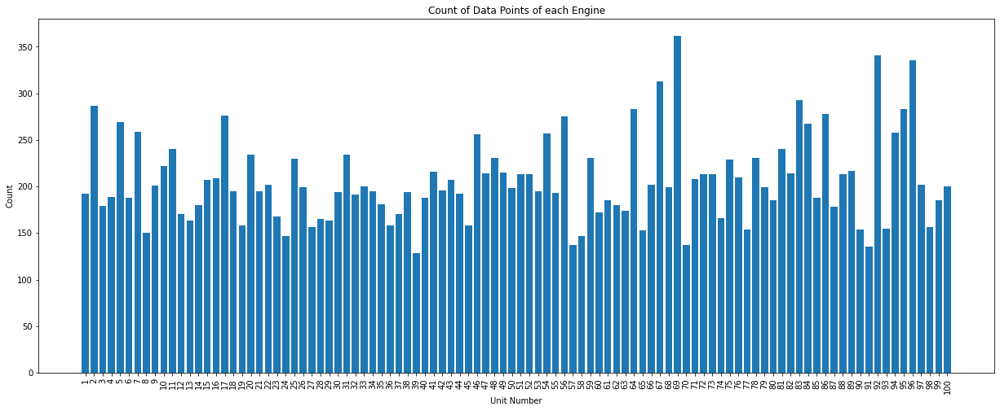

In [0]:
plot_engine_counts(train_fd_001)

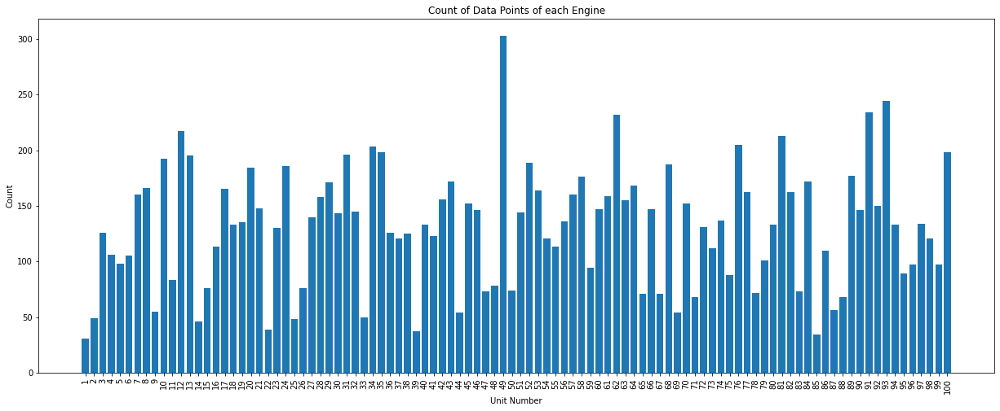

In [0]:
plot_engine_counts(test_fd_001)

### Max Value of each Engine

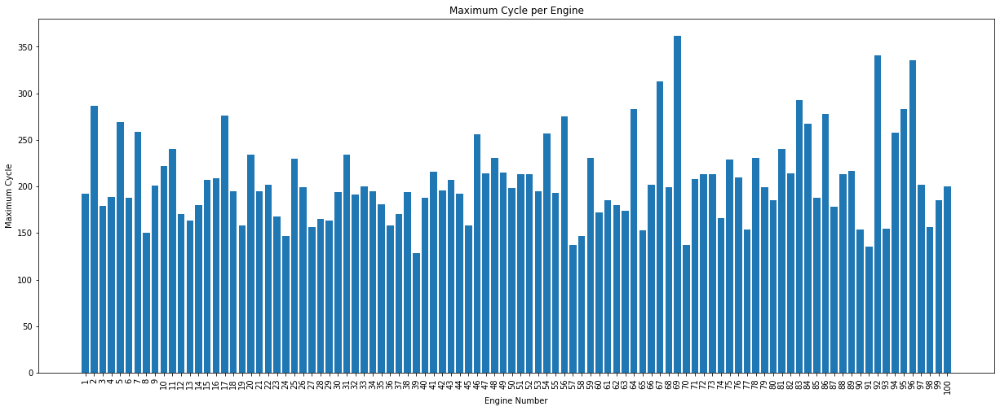

In [0]:
plot_max_cycle_per_engine(train_fd_001)

- Observation: There appear to be a few noticeable outliers.

In [0]:
max_cycle_per_engine = train_fd_001.groupby('unit_number')["time_in_cycles"].max().reset_index()
max_cycle_per_engine.columns = ['engine', 'max_cycle']

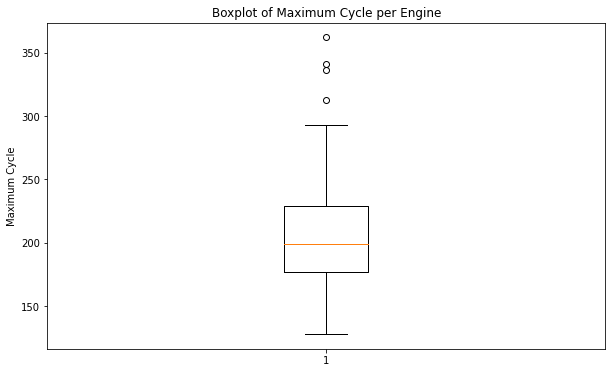

In [0]:
plt.figure(figsize=(10, 6))
plt.boxplot(max_cycle_per_engine['max_cycle'])
plt.title('Boxplot of Maximum Cycle per Engine')
plt.ylabel('Maximum Cycle')
plt.show()

- Ensure we thoroughly inspect the engines with exceptionally long cycle times and consider excluding these outliers to prevent them from skewing the model.

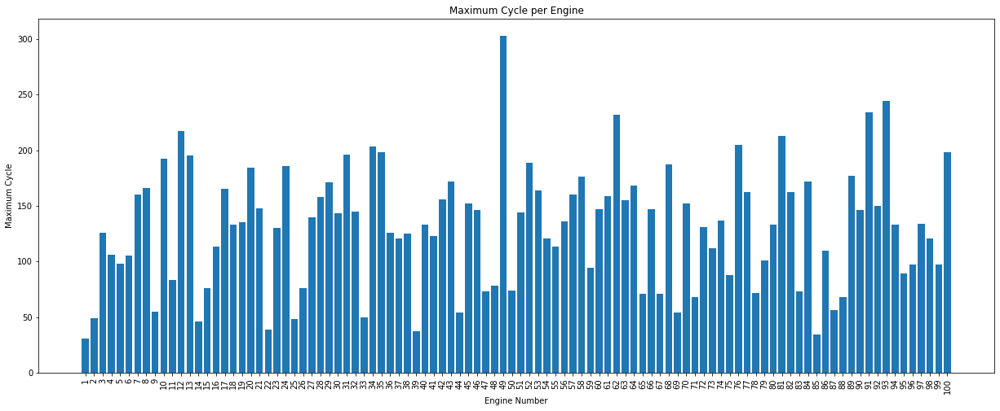

In [0]:
plot_max_cycle_per_engine(test_fd_001)

### Min Cycle Value of each Engine

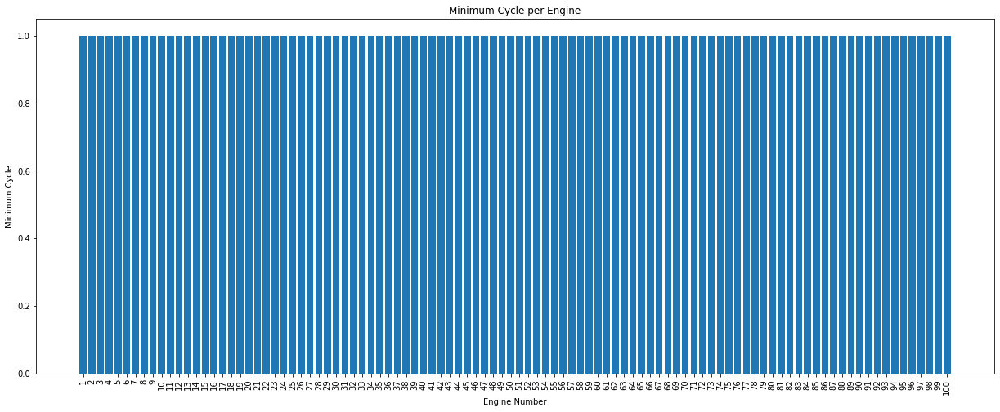

In [0]:
plot_min_cycle_per_engine(train_fd_001)

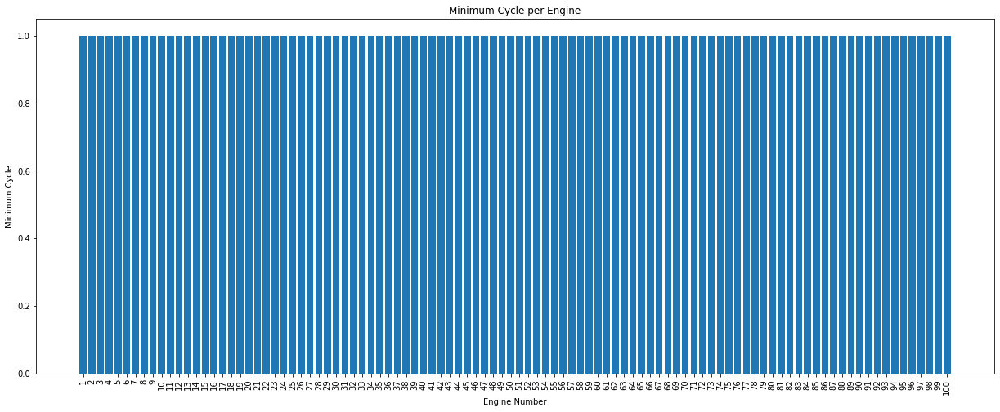

In [0]:
plot_min_cycle_per_engine(test_fd_001)

### Data Integrity: compare the cycle values with the counts of records

In [0]:
compare_max_cycle_and_counts(train_fd_001)

All engines have complete data. No discrepancies found.


In [0]:
compare_max_cycle_and_counts(test_fd_001)

All engines have complete data. No discrepancies found.


- Data Integrity: The number of records for each engine is consistent with its maximum cycle value, indicating that there is a corresponding record for each cycle in the dataset and no records were missed.

- Data Quality: No cases were found where the number of records was not equal to the maximum/miminum cycle value, indicating that the dataset was perfect and there were no duplicates or missing records.

### Histogram of Time_in_Cycle / Line Counts per Unit

- Let's check the distribution of the metric "time_in_cycle" of the dataset

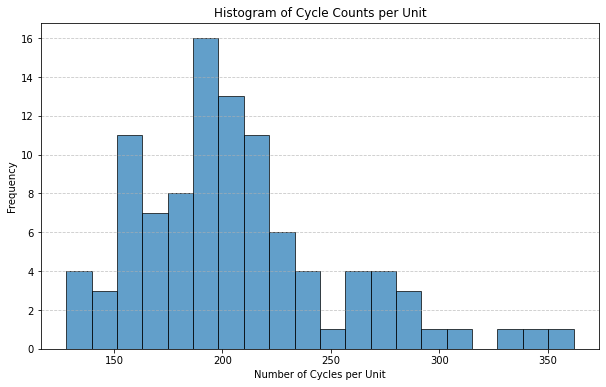

In [0]:
plot_hist_unit_cycle_counts(train_fd_001)

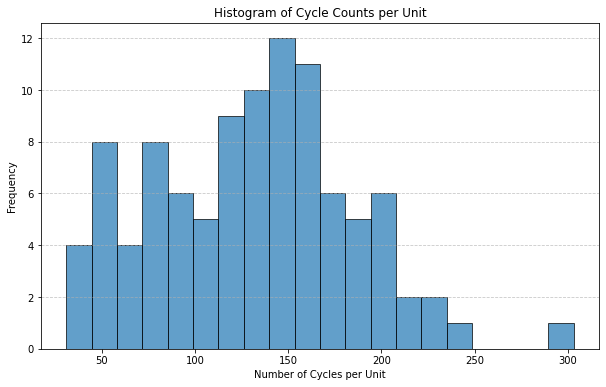

In [0]:
plot_hist_unit_cycle_counts(test_fd_001)

In [0]:
test_fd_001.unit_number.nunique()

Out[42]: 100

### Unique Unit Numbers for Engines

In [0]:
unique_unit_numbers = test_fd_001["unit_number"].unique()
print(unique_unit_numbers)

[  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54
  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72
  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90
  91  92  93  94  95  96  97  98  99 100]


- 100 Engines

- TODO: are these the same 100 engines across all datasets?

In [0]:
tables_to_modify

Out[44]: ['test_fd_001',
 'test_fd_002',
 'test_fd_003',
 'test_fd_004',
 'train_fd_001',
 'train_fd_002',
 'train_fd_003',
 'train_fd_004']

In [0]:
# Dictionary to store unique unit numbers for each DataFrame
unique_unit_numbers = {table: set(globals()[table]["unit_number"].unique()) for table in tables_to_modify}

# Use the first table in the list as the reference
reference_table = tables_to_modify[0]
reference_units = unique_unit_numbers[reference_table]

# Check if all DataFrames have the same unique unit numbers
consistency_check = {table: reference_units == units for table, units in unique_unit_numbers.items()}

# Display results
print(f"Unique Unit Number Check (Reference: {reference_table}):")
for table, is_consistent in consistency_check.items():
    print(f"{table}: {'MATCHES' if is_consistent else 'DOES NOT MATCH'}")

# Optional: Show discrepancies
for table, units in unique_unit_numbers.items():
    if units != reference_units:
        print(f"\nDifferences in {table}:")
        print("Missing in base:", reference_units - units)
        print("Extra in this DF:", units - reference_units)

Unique Unit Number Check (Reference: test_fd_001):
test_fd_001: MATCHES
test_fd_002: DOES NOT MATCH
test_fd_003: MATCHES
test_fd_004: DOES NOT MATCH
train_fd_001: MATCHES
train_fd_002: DOES NOT MATCH
train_fd_003: MATCHES
train_fd_004: DOES NOT MATCH

Differences in test_fd_002:
Missing in base: set()
Extra in this DF: {101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236

- engine numbers: test_fd_001: MATCHES test_fd_003: MATCHES train_fd_001: MATCHES train_fd_003: MATCHES

In [0]:
# List of dataset pairs to compare
dataset_pairs = [
    ("test_fd_002", "test_fd_004"),
    ("train_fd_002", "train_fd_004")
]

# Loop through each pair and compare unique unit numbers
for dataset1, dataset2 in dataset_pairs:
    unique_units_1 = set(globals()[dataset1]["unit_number"].unique())
    unique_units_2 = set(globals()[dataset2]["unit_number"].unique())

    print(f"\nChecking {dataset1} vs {dataset2}...")
    
    if unique_units_1 == unique_units_2:
        print(f"✅ {dataset1} and {dataset2} have the SAME unique unit numbers.")
    else:
        print(f"❌ {dataset1} and {dataset2} have DIFFERENT unique unit numbers.")
        print(f"Missing in {dataset1}:", unique_units_2 - unique_units_1)
        print(f"Missing in {dataset2}:", unique_units_1 - unique_units_2)


Checking test_fd_002 vs test_fd_004...
❌ test_fd_002 and test_fd_004 have DIFFERENT unique unit numbers.
Missing in test_fd_002: set()
Missing in test_fd_004: {256, 257, 258, 259, 249, 250, 251, 252, 253, 254, 255}

Checking train_fd_002 vs train_fd_004...
❌ train_fd_002 and train_fd_004 have DIFFERENT unique unit numbers.
Missing in train_fd_002: set()
Missing in train_fd_004: {256, 257, 258, 259, 260, 250, 251, 252, 253, 254, 255}


- More standard deviation for operational_seeting_1 and 3 as in dataset 001, which is expected.
- At the same time more deviation for sensor measurements.
- For now, we will first investigate dataset 001.

In [0]:
train_fd_002.describe()

,unit_number,time_in_cycles,operational_setting_1,operational_setting_2,operational_setting_3,sensor_measurement_1,sensor_measurement_2,sensor_measurement_3,sensor_measurement_4,sensor_measurement_5,sensor_measurement_6,sensor_measurement_7,sensor_measurement_8,sensor_measurement_9,sensor_measurement_10,sensor_measurement_11,sensor_measurement_12,sensor_measurement_13,sensor_measurement_14,sensor_measurement_15,sensor_measurement_16,sensor_measurement_17,sensor_measurement_18,sensor_measurement_19,sensor_measurement_20,sensor_measurement_21
count,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000
mean,131.082981,109.154746,23.998407,0.572056,94.046020,472.910207,579.672399,1419.971013,1205.442024,8.031986,11.600746,282.606787,2228.879188,8525.200837,1.094962,42.985172,266.069034,2334.557253,8066.597682,9.329654,0.023326,348.309511,2228.806358,97.756838,20.789296,12.473423
std,74.463862,69.180569,14.747376,0.310016,14.237735,26.389707,37.289399,105.946341,119.123428,3.613839,5.431802,146.005306,145.209816,335.812013,0.127469,3.232372,137.659507,128.068271,84.837950,0.749335,0.004711,27.754515,145.327980,5.364067,9.869331,5.921615
min,1.000000,1.000000,0.000000,0.000000,60.000000,445.000000,535.530000,1243.730000,1023.770000,3.910000,5.710000,136.800000,1914.770000,7985.560000,0.930000,36.230000,129.120000,2027.610000,7848.360000,8.335700,0.020000,303.000000,1915.000000,84.930000,10.180000,6.010500
25%,68.000000,52.000000,10.004600,0.250700,100.000000,445.000000,549.570000,1352.760000,1123.655000,3.910000,5.720000,139.935000,2211.880000,8321.660000,1.020000,41.910000,131.520000,2387.900000,8062.140000,8.677800,0.020000,331.000000,2212.000000,100.000000,10.910000,6.546300
50%,131.000000,104.000000,25.001300,0.700000,100.000000,462.540000,555.980000,1369.180000,1138.890000,7.050000,9.030000,194.660000,2223.070000,8361.200000,1.020000,42.390000,183.200000,2388.080000,8082.540000,9.310900,0.020000,335.000000,2223.000000,100.000000,14.880000,8.929200
75%,195.000000,157.000000,41.998000,0.840000,100.000000,491.190000,607.340000,1499.370000,1306.850000,10.520000,15.490000,394.080000,2323.960000,8778.030000,1.260000,45.350000,371.260000,2388.170000,8127.195000,9.386900,0.030000,369.000000,2324.000000,100.000000,28.470000,17.083200
max,260.000000,378.000000,42.008000,0.842000,100.000000,518.670000,644.520000,1612.880000,1439.230000,14.620000,21.610000,555.820000,2388.390000,9215.660000,1.300000,48.510000,523.370000,2390.480000,8268.500000,11.066900,0.030000,399.000000,2388.000000,100.000000,39.340000,23.590100


- Are there any outliers? 

### Check Outliers

#### Boxplots

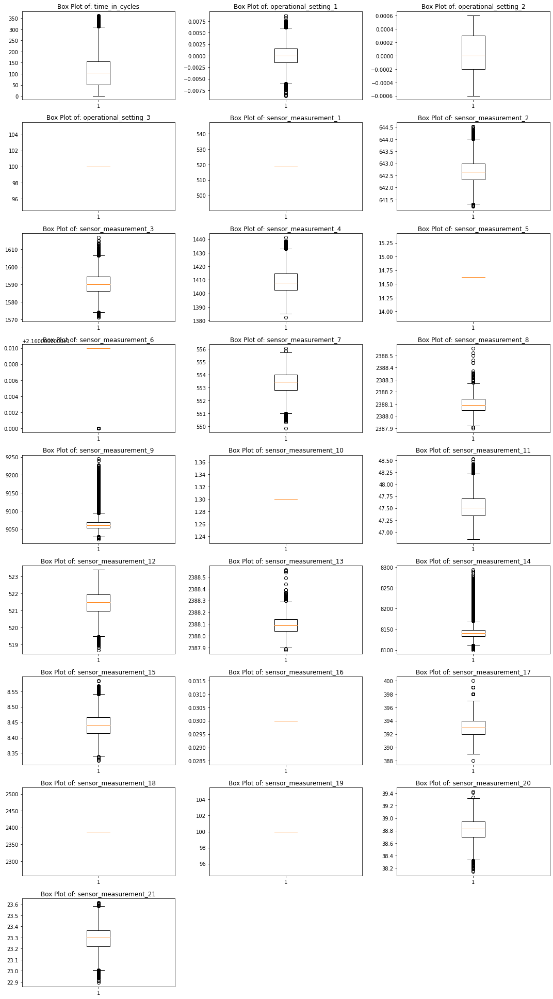

In [0]:
df_plot_train = train_fd_001.drop(columns=['unit_number'])
plt.figure(figsize=(15, 27))
for i, col in enumerate(df_plot_train.columns, start=1):  # without the first column
    temp = train_fd_001[col]  
    plt.subplot(9, 3, i)  
    plt.boxplot(temp)
    plt.title(f"Box Plot of: {col}")  
plt.tight_layout()  # Adjust layout for readability
plt.show()

In [0]:
df_plot_test = test_fd_001.drop(columns=['unit_number'])

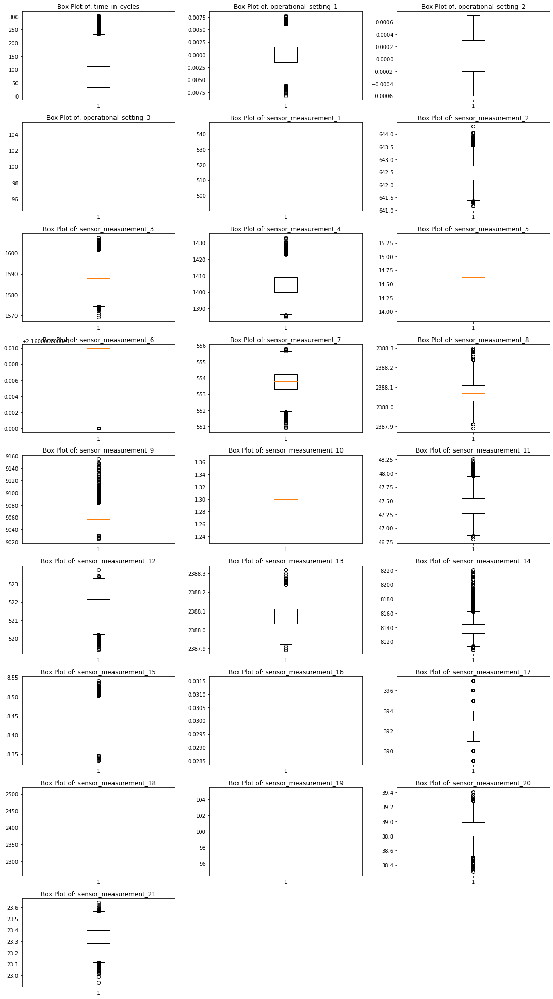

In [0]:
plt.figure(figsize=(15, 27))
for i, col in enumerate(df_plot_test.columns, start=1):  # without the first column
    temp = test_fd_001[col]  
    plt.subplot(9, 3, i)  
    plt.boxplot(temp)
    plt.title(f"Box Plot of: {col}")  

plt.tight_layout()  # Adjust layout for readability
plt.show()

- Based on the oberservation made with boxplots, the following steps can be made:

#### Check Sensor 6 / max. Cycle test/train -> yes, can be excluded

In [0]:
# Find outliers in sensor_6 for train and test sets
outliers_train = detect_outliers_iqr(train_fd_001, "sensor_measurement_6")
outliers_test = detect_outliers_iqr(test_fd_001, "sensor_measurement_6")

# Display the outliers
print("Outliers in Train Data (sensor_6):")
print(outliers_train.loc[:,"sensor_measurement_6"])

print("\nOutliers in Test Data (sensor_6):")
print(outliers_test.loc[:,"sensor_measurement_6"])

Outliers in Train Data (sensor_6):
192      21.6
194      21.6
196      21.6
200      21.6
201      21.6
         ... 
20165    21.6
20252    21.6
20286    21.6
20432    21.6
20490    21.6
Name: sensor_measurement_6, Length: 406, dtype: float64

Outliers in Test Data (sensor_6):
471      21.6
519      21.6
534      21.6
550      21.6
610      21.6
         ... 
12944    21.6
12980    21.6
13004    21.6
13024    21.6
13052    21.6
Name: sensor_measurement_6, Length: 392, dtype: float64


In [0]:
train_fd_001.loc[:,['sensor_measurement_6']]

,sensor_measurement_6
0,21.61
1,21.61
2,21.61
3,21.61
4,21.61
...,...
20626,21.61
20627,21.61
20628,21.61
20629,21.61


In [0]:
train_fd_001[train_fd_001.sensor_measurement_6!= 21.61]

,unit_number,time_in_cycles,operational_setting_1,operational_setting_2,operational_setting_3,sensor_measurement_1,sensor_measurement_2,sensor_measurement_3,sensor_measurement_4,sensor_measurement_5,sensor_measurement_6,sensor_measurement_7,sensor_measurement_8,sensor_measurement_9,sensor_measurement_10,sensor_measurement_11,sensor_measurement_12,sensor_measurement_13,sensor_measurement_14,sensor_measurement_15,sensor_measurement_16,sensor_measurement_17,sensor_measurement_18,sensor_measurement_19,sensor_measurement_20,sensor_measurement_21
192,2,1,-0.0018,0.0006,100.0,518.67,641.89,1583.84,1391.28,14.62,21.6,554.53,2388.01,9054.72,1.3,46.93,522.33,2388.06,8137.72,8.3905,0.03,391,2388,100.0,38.94,23.4585
194,2,3,0.0018,0.0003,100.0,518.67,641.55,1588.32,1398.96,14.62,21.6,555.14,2388.04,9054.24,1.3,47.22,522.58,2387.99,8140.58,8.3802,0.03,391,2388,100.0,39.11,23.4250
196,2,5,0.0005,0.0004,100.0,518.67,641.73,1579.03,1402.52,14.62,21.6,555.12,2388.03,9058.15,1.3,47.25,522.27,2387.94,8136.67,8.3867,0.03,390,2388,100.0,39.18,23.4234
200,2,9,0.0017,-0.0004,100.0,518.67,641.98,1581.99,1395.01,14.62,21.6,554.69,2388.02,9051.67,1.3,47.14,522.40,2387.98,8145.29,8.3868,0.03,390,2388,100.0,39.06,23.4875
201,2,10,-0.0045,0.0002,100.0,518.67,641.99,1586.37,1394.86,14.62,21.6,554.63,2387.99,9058.88,1.3,47.21,521.99,2387.97,8138.64,8.3982,0.03,391,2388,100.0,39.20,23.6005
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20165,98,76,0.0025,-0.0004,100.0,518.67,642.16,1586.25,1401.99,14.62,21.6,554.88,2388.01,9059.23,1.3,47.30,522.50,2388.03,8149.74,8.3935,0.03,393,2388,100.0,38.98,23.3505
20252,99,7,-0.0032,-0.0001,100.0,518.67,642.02,1584.95,1407.88,14.62,21.6,553.74,2388.02,9054.70,1.3,47.31,522.31,2388.07,8133.85,8.4420,0.03,392,2388,100.0,39.11,23.4092
20286,99,41,0.0036,-0.0002,100.0,518.67,641.88,1588.07,1402.10,14.62,21.6,554.14,2388.11,9054.40,1.3,47.40,522.22,2388.07,8139.82,8.3759,0.03,392,2388,100.0,38.78,23.4523
20432,100,2,0.0010,-0.0004,100.0,518.67,642.37,1589.43,1397.40,14.62,21.6,554.33,2388.06,9060.51,1.3,47.39,521.81,2388.10,8143.56,8.4186,0.03,393,2388,100.0,39.18,23.2460


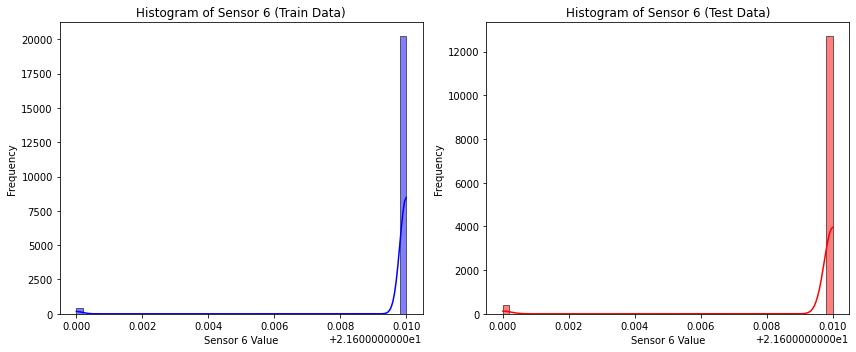

In [0]:
# Plot histograms for sensor_6 in both datasets
plt.figure(figsize=(12, 5))

# Histogram for train data
plt.subplot(1, 2, 1)
sns.histplot(train_fd_001["sensor_measurement_6"], bins=50, kde=True, color="blue")
plt.title("Histogram of Sensor 6 (Train Data)")
plt.xlabel("Sensor 6 Value")
plt.ylabel("Frequency")

# Histogram for test data
plt.subplot(1, 2, 2)
sns.histplot(test_fd_001["sensor_measurement_6"], bins=50, kde=True, color="red")
plt.title("Histogram of Sensor 6 (Test Data)")
plt.xlabel("Sensor 6 Value")
plt.ylabel("Frequency")

# Show the plots
plt.tight_layout()
plt.show()


- So the values of sensor 6 remains almost the same. It can be removed for further modelling because constant values don't provide additional input for now
- Let's take a look at the max. time_in_cycles next:

In [0]:
max_cycle_per_engine = train_fd_001.groupby('unit_number')['time_in_cycles'].max().reset_index()

# Rename columns
max_cycle_per_engine.columns = ['engine', 'max_cycle']

In [0]:
max_cycle_per_engine

,engine,max_cycle
0,1,192
1,2,287
2,3,179
3,4,189
4,5,269
...,...,...
95,96,336
96,97,202
97,98,156
98,99,185


In [0]:
# Find outliers in max. cycle for train data set
outliers_train = detect_outliers_iqr(max_cycle_per_engine, "max_cycle")
# outliers_test = detect_outliers_iqr(max_cycle_per_engine, "max_cycle")

# Display the outliers
print("Outliers in Train Data max_cycle:")
print(outliers_train)

Outliers in Train Data max_cycle:
    engine  max_cycle
66      67        313
68      69        362
91      92        341
95      96        336


#### Remove these 4 Outlier Engines in Max. Time in Cycles in Train Data

In [0]:
train_fd_001_mod = train_fd_001[~train_fd_001['unit_number'].isin(outliers_train['engine'])]

In [0]:
train_fd_001.shape

Out[59]: (20631, 26)

In [0]:
train_fd_001_mod.shape

Out[60]: (19279, 26)

In [0]:
train_fd_001_mod.columns

Out[61]: Index(['unit_number', 'time_in_cycles', 'operational_setting_1',
       'operational_setting_2', 'operational_setting_3',
       'sensor_measurement_1', 'sensor_measurement_2', 'sensor_measurement_3',
       'sensor_measurement_4', 'sensor_measurement_5', 'sensor_measurement_6',
       'sensor_measurement_7', 'sensor_measurement_8', 'sensor_measurement_9',
       'sensor_measurement_10', 'sensor_measurement_11',
       'sensor_measurement_12', 'sensor_measurement_13',
       'sensor_measurement_14', 'sensor_measurement_15',
       'sensor_measurement_16', 'sensor_measurement_17',
       'sensor_measurement_18', 'sensor_measurement_19',
       'sensor_measurement_20', 'sensor_measurement_21'],
      dtype='object')

#### Constant Values to Exclude for the Modelling

- Several sensors showing the same value during the period (sensor 1,5,6(one outlier), 10,16,18,19)
- Operating setting 3 does not change as expected
- The same oberservation could be made both for train- & test data set 001
- These parameters can be removed from the parameters to be used for modelling to simplify the model

In [0]:
# List of columns to be deleted
columns_to_drop = [
    "operational_setting_1", "operational_setting_2", "operational_setting_3",
    "sensor_measurement_1", "sensor_measurement_5", "sensor_measurement_6",
    "sensor_measurement_10", "sensor_measurement_16", "sensor_measurement_18",
    "sensor_measurement_19"
]


for col in columns_to_drop:
    if col in train_fd_001_mod.columns:  # Check if the column exists before dropping
        train_fd_001_mod.drop(columns=[col], inplace=True)

# Display the modified DataFrame
train_fd_001_mod.head()

/databricks/python/lib/python3.9/site-packages/pandas/core/frame.py:4906: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


,unit_number,time_in_cycles,sensor_measurement_2,sensor_measurement_3,sensor_measurement_4,sensor_measurement_7,sensor_measurement_8,sensor_measurement_9,sensor_measurement_11,sensor_measurement_12,sensor_measurement_13,sensor_measurement_14,sensor_measurement_15,sensor_measurement_17,sensor_measurement_20,sensor_measurement_21
0,1,1,641.82,1589.70,1400.60,554.36,2388.06,9046.19,47.47,521.66,2388.02,8138.62,8.4195,392,39.06,23.4190
1,1,2,642.15,1591.82,1403.14,553.75,2388.04,9044.07,47.49,522.28,2388.07,8131.49,8.4318,392,39.00,23.4236
2,1,3,642.35,1587.99,1404.20,554.26,2388.08,9052.94,47.27,522.42,2388.03,8133.23,8.4178,390,38.95,23.3442
3,1,4,642.35,1582.79,1401.87,554.45,2388.11,9049.48,47.13,522.86,2388.08,8133.83,8.3682,392,38.88,23.3739
4,1,5,642.37,1582.85,1406.22,554.00,2388.06,9055.15,47.28,522.19,2388.04,8133.80,8.4294,393,38.90,23.4044


In [0]:
test_fd_001_mod = test_fd_001.copy()

for col in columns_to_drop:
    if col in test_fd_001_mod.columns:  # Check if the column exists before dropping
        test_fd_001_mod.drop(columns=[col], inplace=True)

# Display the modified DataFrame
test_fd_001_mod.head()

,unit_number,time_in_cycles,sensor_measurement_2,sensor_measurement_3,sensor_measurement_4,sensor_measurement_7,sensor_measurement_8,sensor_measurement_9,sensor_measurement_11,sensor_measurement_12,sensor_measurement_13,sensor_measurement_14,sensor_measurement_15,sensor_measurement_17,sensor_measurement_20,sensor_measurement_21
0,1,1,643.02,1585.29,1398.21,553.90,2388.04,9050.17,47.20,521.72,2388.03,8125.55,8.4052,392,38.86,23.3735
1,1,2,641.71,1588.45,1395.42,554.85,2388.01,9054.42,47.50,522.16,2388.06,8139.62,8.3803,393,39.02,23.3916
2,1,3,642.46,1586.94,1401.34,554.11,2388.05,9056.96,47.50,521.97,2388.03,8130.10,8.4441,393,39.08,23.4166
3,1,4,642.44,1584.12,1406.42,554.07,2388.03,9045.29,47.28,521.38,2388.05,8132.90,8.3917,391,39.00,23.3737
4,1,5,642.51,1587.19,1401.92,554.16,2388.01,9044.55,47.31,522.15,2388.03,8129.54,8.4031,390,38.99,23.4130


In [0]:
train_fd_001_mod.shape

Out[64]: (19279, 16)

In [0]:
test_fd_001_mod.shape

Out[65]: (13096, 16)

### Check Missing Values

In [0]:
for table in tables_to_modify:
    print(f"null values in {table}")
    print(globals()[table].isnull().sum())

null values in test_fd_001
unit_number              0
time_in_cycles           0
operational_setting_1    0
operational_setting_2    0
operational_setting_3    0
sensor_measurement_1     0
sensor_measurement_2     0
sensor_measurement_3     0
sensor_measurement_4     0
sensor_measurement_5     0
sensor_measurement_6     0
sensor_measurement_7     0
sensor_measurement_8     0
sensor_measurement_9     0
sensor_measurement_10    0
sensor_measurement_11    0
sensor_measurement_12    0
sensor_measurement_13    0
sensor_measurement_14    0
sensor_measurement_15    0
sensor_measurement_16    0
sensor_measurement_17    0
sensor_measurement_18    0
sensor_measurement_19    0
sensor_measurement_20    0
sensor_measurement_21    0
dtype: int64
null values in test_fd_002
unit_number              0
time_in_cycles           0
operational_setting_1    0
operational_setting_2    0
operational_setting_3    0
sensor_measurement_1     0
sensor_measurement_2     0
sensor_measurement_3     0
sensor_measurem

In [0]:
for table in tables_to_modify:
    print(f"null values in {table}")
    if globals()[table].isnull().sum().any():
        print(globals()[table].isnull().sum())

null values in test_fd_001
null values in test_fd_002
null values in test_fd_003
null values in test_fd_004
null values in train_fd_001
null values in train_fd_002
null values in train_fd_003
null values in train_fd_004


- no missing values

### Check duplicates

In [0]:
test_fd_001.duplicated().sum()

Out[68]: 0

In [0]:
for table in tables_to_modify:
    print(f"duplicates in {table}")
    if globals()[table].duplicated().sum().any():
        print(globals()[table].duplicated().sum())

duplicates in test_fd_001
duplicates in test_fd_002
duplicates in test_fd_003
duplicates in test_fd_004
duplicates in train_fd_001
duplicates in train_fd_002
duplicates in train_fd_003
duplicates in train_fd_004


### LATER TODO USE ProfileReport

In [0]:
# pip install pandas-profiling

In [0]:
# from pandas_profiling import ProfileReport

### Add RUL to Train Data

In [0]:
df_train_RUL = train_fd_001_mod.groupby(['unit_number']).agg({'time_in_cycles':'max'})

In [0]:
df_train_RUL.head()

,time_in_cycles
unit_number,
1,192
2,287
3,179
4,189
5,269


In [0]:
df_train_RUL.reset_index(inplace=True)

In [0]:
df_train_RUL.columns

Out[75]: Index(['unit_number', 'time_in_cycles'], dtype='object')

In [0]:
df_train_RUL.columns = ['unit_number', 'max_cycle']

In [0]:
train_fd_001_mod = train_fd_001_mod.merge(df_train_RUL,how='left',on=['unit_number'])

In [0]:
train_fd_001_mod.head()

,unit_number,time_in_cycles,sensor_measurement_2,sensor_measurement_3,sensor_measurement_4,sensor_measurement_7,sensor_measurement_8,sensor_measurement_9,sensor_measurement_11,sensor_measurement_12,sensor_measurement_13,sensor_measurement_14,sensor_measurement_15,sensor_measurement_17,sensor_measurement_20,sensor_measurement_21,max_cycle
0,1,1,641.82,1589.70,1400.60,554.36,2388.06,9046.19,47.47,521.66,2388.02,8138.62,8.4195,392,39.06,23.4190,192
1,1,2,642.15,1591.82,1403.14,553.75,2388.04,9044.07,47.49,522.28,2388.07,8131.49,8.4318,392,39.00,23.4236,192
2,1,3,642.35,1587.99,1404.20,554.26,2388.08,9052.94,47.27,522.42,2388.03,8133.23,8.4178,390,38.95,23.3442,192
3,1,4,642.35,1582.79,1401.87,554.45,2388.11,9049.48,47.13,522.86,2388.08,8133.83,8.3682,392,38.88,23.3739,192
4,1,5,642.37,1582.85,1406.22,554.00,2388.06,9055.15,47.28,522.19,2388.04,8133.80,8.4294,393,38.90,23.4044,192


In [0]:
train_fd_001_mod['RUL'] = train_fd_001_mod['max_cycle'] - train_fd_001_mod['time_in_cycles']

In [0]:
train_fd_001_mod.head()

,unit_number,time_in_cycles,sensor_measurement_2,sensor_measurement_3,sensor_measurement_4,sensor_measurement_7,sensor_measurement_8,sensor_measurement_9,sensor_measurement_11,sensor_measurement_12,sensor_measurement_13,sensor_measurement_14,sensor_measurement_15,sensor_measurement_17,sensor_measurement_20,sensor_measurement_21,max_cycle,RUL
0,1,1,641.82,1589.70,1400.60,554.36,2388.06,9046.19,47.47,521.66,2388.02,8138.62,8.4195,392,39.06,23.4190,192,191
1,1,2,642.15,1591.82,1403.14,553.75,2388.04,9044.07,47.49,522.28,2388.07,8131.49,8.4318,392,39.00,23.4236,192,190
2,1,3,642.35,1587.99,1404.20,554.26,2388.08,9052.94,47.27,522.42,2388.03,8133.23,8.4178,390,38.95,23.3442,192,189
3,1,4,642.35,1582.79,1401.87,554.45,2388.11,9049.48,47.13,522.86,2388.08,8133.83,8.3682,392,38.88,23.3739,192,188
4,1,5,642.37,1582.85,1406.22,554.00,2388.06,9055.15,47.28,522.19,2388.04,8133.80,8.4294,393,38.90,23.4044,192,187


In [0]:
train_fd_001_mod.drop(['max_cycle'], axis=1, inplace=True)

In [0]:
train_fd_001_mod.shape

Out[82]: (19279, 17)

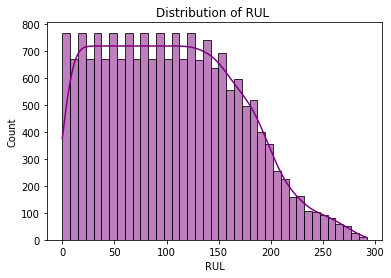

In [0]:
plt.figure(figsize=(6, 4))
sns.histplot(train_fd_001_mod['RUL'], kde=True, color="purple")
plt.title(f"Distribution of RUL")
plt.show()

In [0]:
failure_time = train_fd_001_mod.groupby('unit_number')['RUL'].max()

#### Histogram

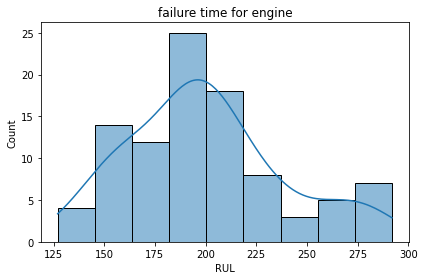

In [0]:
# distribution of failure time per engine
sns.histplot(failure_time , kde=True)
plt.title('failure time for engine')
plt.tight_layout()

## Time Serie Analysis: Scatter Plot all sensor data

In [0]:
train_fd_001.columns

Out[85]: Index(['unit_number', 'time_in_cycles', 'operational_setting_1',
       'operational_setting_2', 'operational_setting_3',
       'sensor_measurement_1', 'sensor_measurement_2', 'sensor_measurement_3',
       'sensor_measurement_4', 'sensor_measurement_5', 'sensor_measurement_6',
       'sensor_measurement_7', 'sensor_measurement_8', 'sensor_measurement_9',
       'sensor_measurement_10', 'sensor_measurement_11',
       'sensor_measurement_12', 'sensor_measurement_13',
       'sensor_measurement_14', 'sensor_measurement_15',
       'sensor_measurement_16', 'sensor_measurement_17',
       'sensor_measurement_18', 'sensor_measurement_19',
       'sensor_measurement_20', 'sensor_measurement_21'],
      dtype='object')

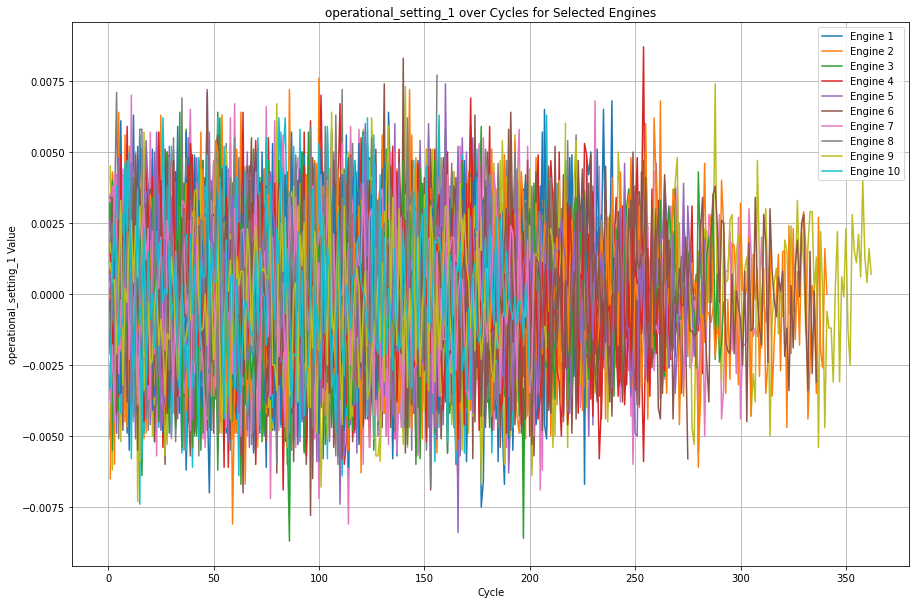

In [0]:
# TRAIN DATA
plot_operational_setting(train_fd_001)

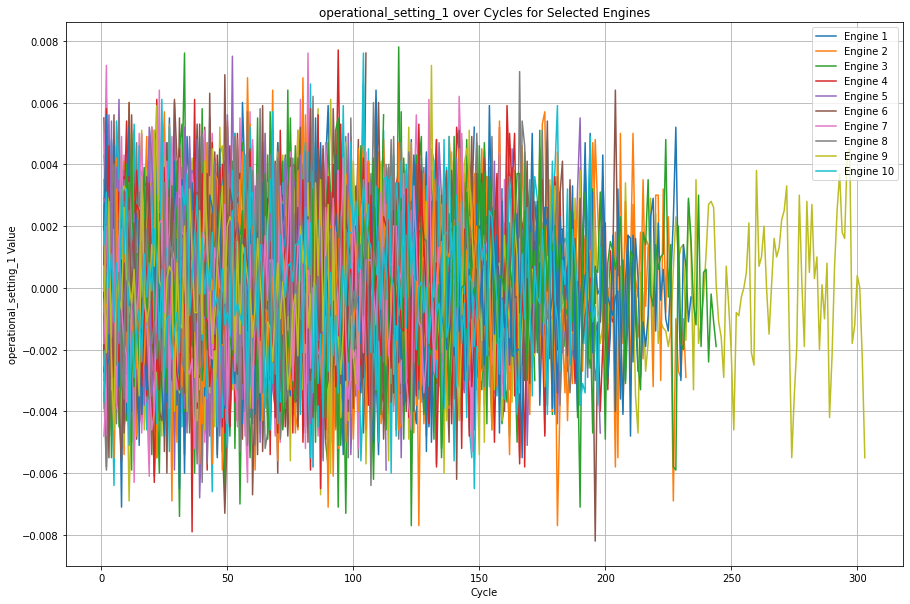

In [0]:
# TEST DATA
plot_operational_setting(test_fd_001)

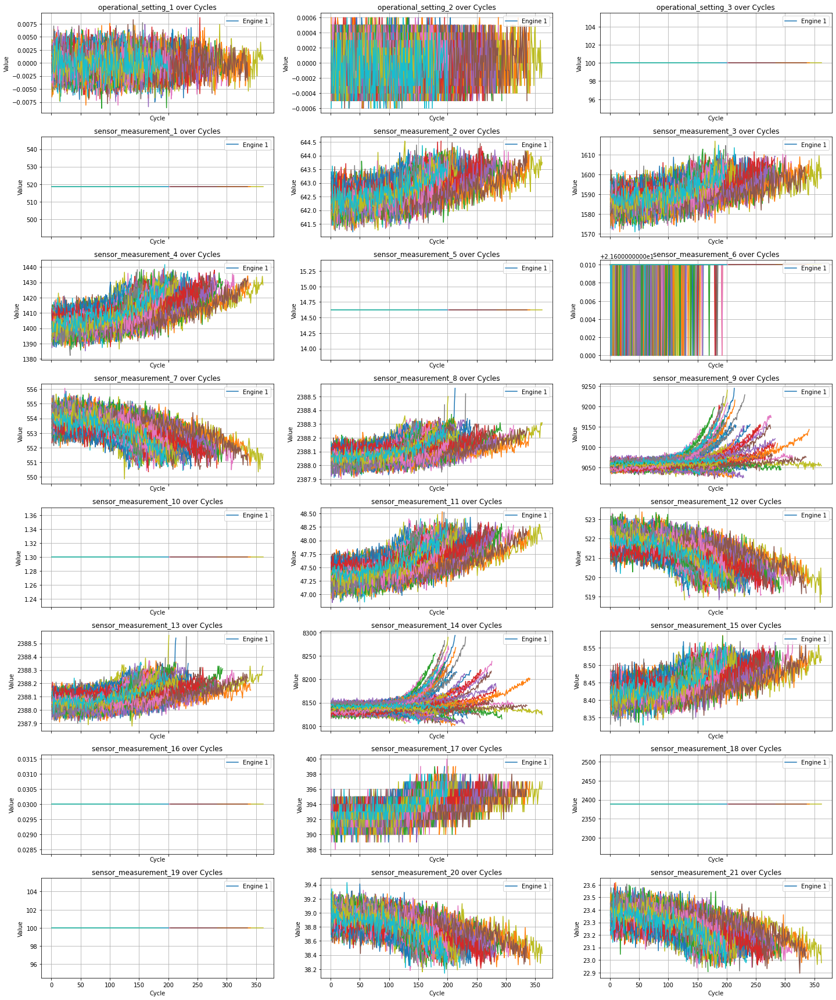

In [0]:
# TRAIN DATA
plot_all_data(train_fd_001)

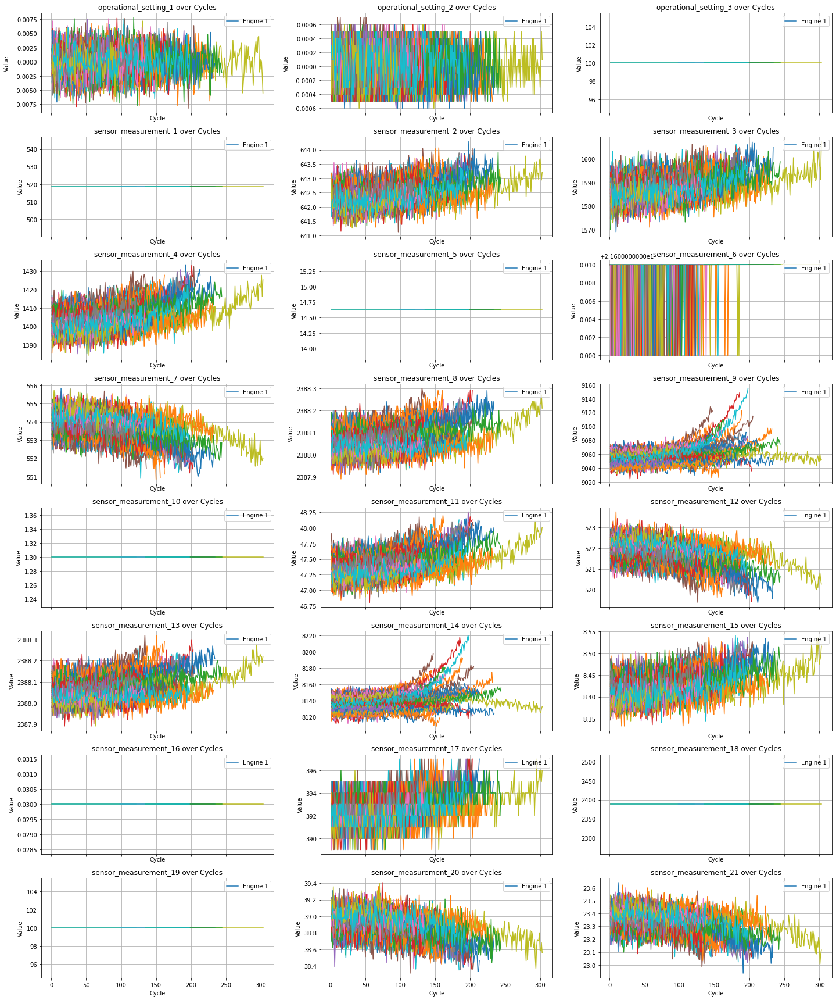

In [0]:
# TEST DATA
plot_all_data(test_fd_001)

In [0]:
# Compute correlation between 'operational_setting_1' and 'time_in_cycles'
correlation = train_fd_001["operational_setting_1"].corr(train_fd_001["time_in_cycles"])

# Display the correlation result
print(f"Correlation between 'operational_setting_1' and 'time_in_cycles': {correlation:.4f}")

Correlation between 'operational_setting_1' and 'time_in_cycles': -0.0045


In [0]:
# Compute correlation between 'operational_setting_1' and 'time_in_cycles'
correlation = train_fd_001["operational_setting_2"].corr(train_fd_001["time_in_cycles"])

# Display the correlation result
print(f"Correlation between 'operational_setting_2' and 'time_in_cycles': {correlation:.4f}")

Correlation between 'operational_setting_2' and 'time_in_cycles': 0.0161


In [0]:
# Compute correlation between 'operational_setting_1' and 'time_in_cycles'
correlation = test_fd_001["operational_setting_1"].corr(test_fd_001["time_in_cycles"])

# Display the correlation result
print(f"Correlation between 'operational_setting_1' and 'time_in_cycles': {correlation:.4f}")

Correlation between 'operational_setting_1' and 'time_in_cycles': -0.0032


In [0]:
# Compute correlation between 'operational_setting_1' and 'time_in_cycles'
correlation = test_fd_001["operational_setting_2"].corr(test_fd_001["time_in_cycles"])

# Display the correlation result
print(f"Correlation between 'operational_setting_2' and 'time_in_cycles': {correlation:.4f}")

Correlation between 'operational_setting_2' and 'time_in_cycles': -0.0205


- Uses Pandas .corr() method to calculate the Pearson correlation coefficient.
Prints the correlation value to understand the relationship:
Close to +1 → Strong positive correlation.
Close to -1 → Strong negative correlation.
Near 0 → No significant correlation.

- Also the setting1 & setting2 did not show a clear trend with cycle. This indicates that these setting parameters do not change significantly from cycle to cycle, and can be considered to be independent of the cycle.

## TODO Summary EDA

## Detect Features which are highly correlated to reduce dimension / heatmap

In [0]:
# drop all but one of the highly correlated features
cor_matrix = train_fd_001_mod.corr().abs()

# get upper tri
upper_tri = cor_matrix.where(np.triu(np.ones(cor_matrix.shape), k=1).astype(bool))

# find the correlated columns
corr_features = [column for column in upper_tri.columns if any(upper_tri[column] > 0.95)]
print(corr_features)

# drop the highly correlated features
# df_train.drop(corr_features, axis=1, inplace=True)
# df_test.drop(corr_features, axis=1, inplace=True)

['sensor_measurement_14']


In [0]:
cor_matrix

,unit_number,time_in_cycles,sensor_measurement_2,sensor_measurement_3,sensor_measurement_4,sensor_measurement_7,sensor_measurement_8,sensor_measurement_9,sensor_measurement_11,sensor_measurement_12,sensor_measurement_13,sensor_measurement_14,sensor_measurement_15,sensor_measurement_17,sensor_measurement_20,sensor_measurement_21,RUL
unit_number,1.000000,0.018286,0.018772,0.016927,0.030962,0.037063,0.045456,0.050480,0.029823,0.035750,0.047756,0.056967,0.028212,0.016574,0.022677,0.020568,0.018286
time_in_cycles,0.018286,1.000000,0.561005,0.556435,0.635048,0.602835,0.473039,0.473455,0.643868,0.617656,0.474488,0.401435,0.600518,0.579229,0.593261,0.596764,0.813642
sensor_measurement_2,0.018772,0.561005,1.000000,0.605402,0.717797,0.703603,0.663016,0.269743,0.741697,0.726835,0.663078,0.176407,0.677773,0.632607,0.663785,0.670179,0.622281
sensor_measurement_3,0.016927,0.556435,0.605402,1.000000,0.680140,0.666635,0.603181,0.319567,0.698050,0.682007,0.602178,0.233927,0.642121,0.603625,0.628065,0.635378,0.600564
sensor_measurement_4,0.030962,0.635048,0.717797,0.680140,1.000000,0.794205,0.747103,0.291410,0.831457,0.817704,0.745845,0.185466,0.760189,0.705888,0.748974,0.746622,0.695959
sensor_measurement_7,0.037063,0.602835,0.703603,0.666635,0.794205,1.000000,0.768338,0.209446,0.823936,0.814048,0.766571,0.102761,0.749030,0.695381,0.737940,0.739038,0.673170
sensor_measurement_8,0.045456,0.473039,0.663016,0.603181,0.747103,0.768338,1.000000,0.043818,0.782746,0.788147,0.829472,0.155152,0.701687,0.627329,0.687591,0.689479,0.572567
sensor_measurement_9,0.050480,0.473455,0.269743,0.319567,0.291410,0.209446,0.043818,1.000000,0.267884,0.201755,0.045238,0.964617,0.288832,0.334618,0.280137,0.287143,0.402454
sensor_measurement_11,0.029823,0.643868,0.741697,0.698050,0.831457,0.823936,0.782746,0.267884,1.000000,0.848544,0.781391,0.157638,0.782365,0.724738,0.772900,0.774715,0.712753
sensor_measurement_12,0.035750,0.617656,0.726835,0.682007,0.817704,0.814048,0.788147,0.201755,0.848544,1.000000,0.790307,0.091000,0.768995,0.705528,0.753814,0.758671,0.687914


In [0]:
upper_tri

,unit_number,time_in_cycles,sensor_measurement_2,sensor_measurement_3,sensor_measurement_4,sensor_measurement_7,sensor_measurement_8,sensor_measurement_9,sensor_measurement_11,sensor_measurement_12,sensor_measurement_13,sensor_measurement_14,sensor_measurement_15,sensor_measurement_17,sensor_measurement_20,sensor_measurement_21,RUL
unit_number,NaN,0.018286,0.018772,0.016927,0.030962,0.037063,0.045456,0.050480,0.029823,0.035750,0.047756,0.056967,0.028212,0.016574,0.022677,0.020568,0.018286
time_in_cycles,NaN,NaN,0.561005,0.556435,0.635048,0.602835,0.473039,0.473455,0.643868,0.617656,0.474488,0.401435,0.600518,0.579229,0.593261,0.596764,0.813642
sensor_measurement_2,NaN,NaN,NaN,0.605402,0.717797,0.703603,0.663016,0.269743,0.741697,0.726835,0.663078,0.176407,0.677773,0.632607,0.663785,0.670179,0.622281
sensor_measurement_3,NaN,NaN,NaN,NaN,0.680140,0.666635,0.603181,0.319567,0.698050,0.682007,0.602178,0.233927,0.642121,0.603625,0.628065,0.635378,0.600564
sensor_measurement_4,NaN,NaN,NaN,NaN,NaN,0.794205,0.747103,0.291410,0.831457,0.817704,0.745845,0.185466,0.760189,0.705888,0.748974,0.746622,0.695959
sensor_measurement_7,NaN,NaN,NaN,NaN,NaN,NaN,0.768338,0.209446,0.823936,0.814048,0.766571,0.102761,0.749030,0.695381,0.737940,0.739038,0.673170
sensor_measurement_8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.043818,0.782746,0.788147,0.829472,0.155152,0.701687,0.627329,0.687591,0.689479,0.572567
sensor_measurement_9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.267884,0.201755,0.045238,0.964617,0.288832,0.334618,0.280137,0.287143,0.402454
sensor_measurement_11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.848544,0.781391,0.157638,0.782365,0.724738,0.772900,0.774715,0.712753
sensor_measurement_12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.790307,0.091000,0.768995,0.705528,0.753814,0.758671,0.687914


In [0]:
# drop all but one of the highly correlated features
cor_matrix = test_fd_001_mod.corr().abs()

# get upper tri
upper_tri = cor_matrix.where(np.triu(np.ones(cor_matrix.shape), k=1).astype(bool))

# find the correlated columns
corr_features = [column for column in upper_tri.columns if any(upper_tri[column] > 0.95)]
print(corr_features)

[]


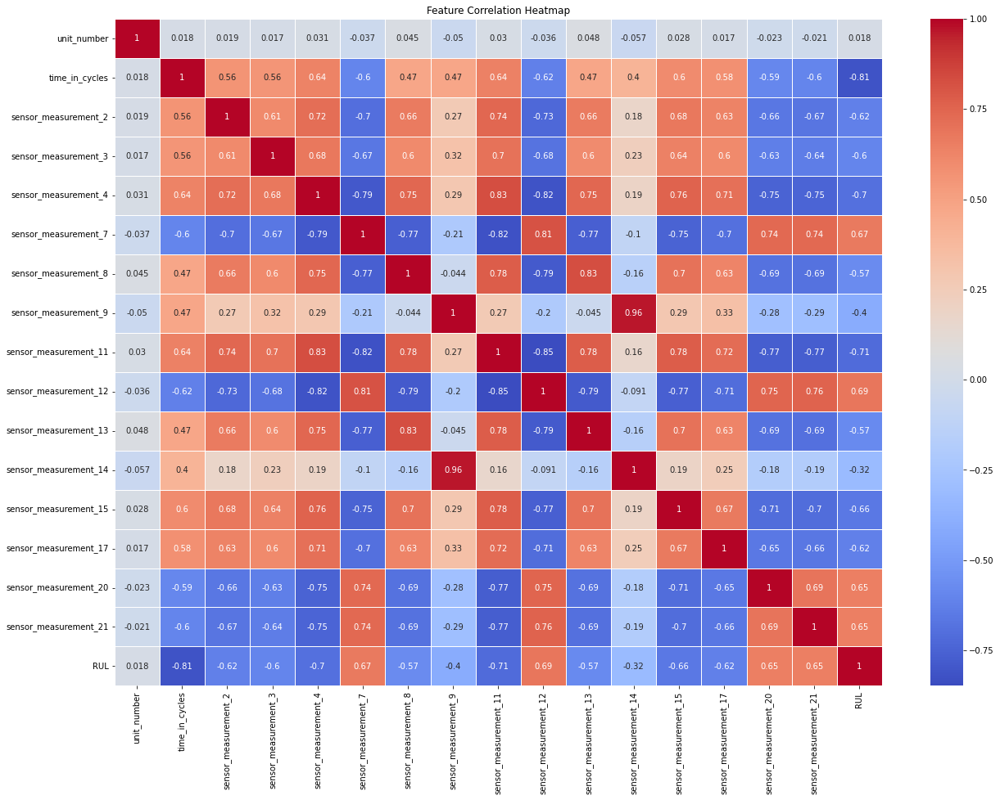

In [0]:
# Compute correlation matrix
correlation_matrix = train_fd_001_mod.corr()

# Plot heatmap
plt.figure(figsize=(21, 15))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Feature Correlation Heatmap")
plt.show()

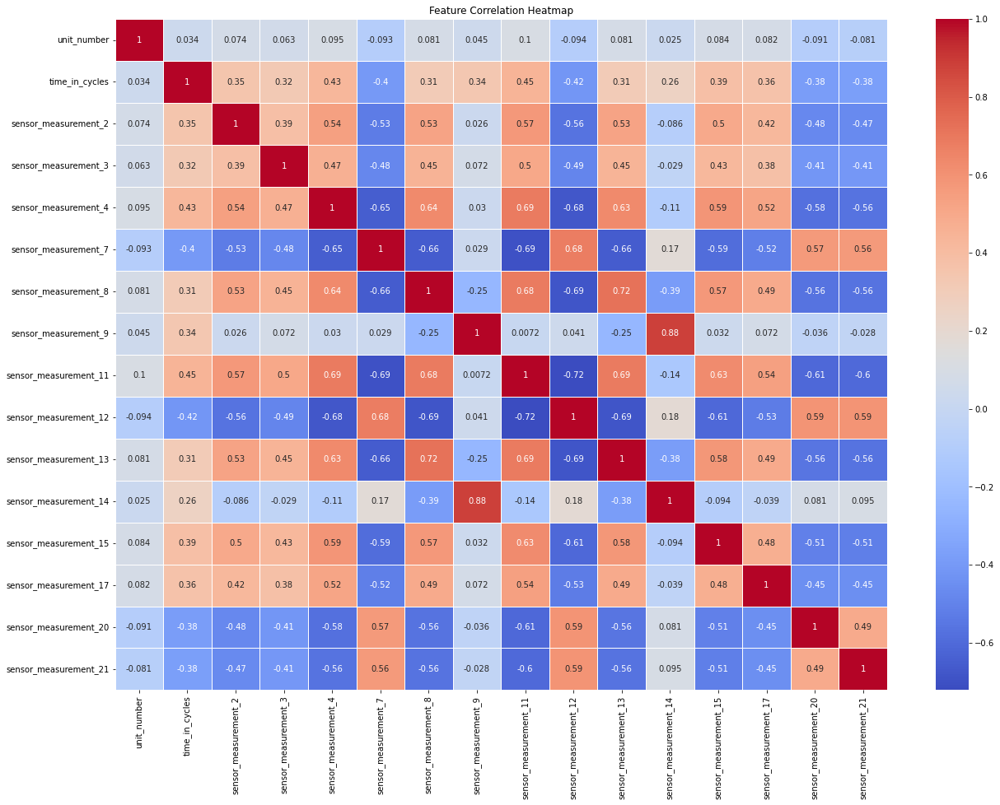

In [0]:
# Compute correlation matrix
correlation_matrix = test_fd_001_mod.corr()

# Plot heatmap
plt.figure(figsize=(21, 15))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Feature Correlation Heatmap")
plt.show()

## Todo Sensor Column Dict

In [0]:
"""
Sensor_dictionary={}
dict_list = 
{'sm_1': '(Fan inlet temperature) (◦R)',
 'sm_2': '(LPC outlet temperature) (◦R)',
 'sm_3': '(HPC outlet temperature) (◦R)',
 'sm_4': '(LPT outlet temperature) (◦R)',
 'sm_5': '(Fan inlet Pressure) (psia)',
 'sm_6': '(bypass-duct pressure) (psia)',
 'sm_7': '(HPC outlet pressure) (psia)',
 'sm_8': '(Physical fan speed) (rpm)',
 'sm_9': '(Physical core speed) (rpm)',
 'sm_10': '(Engine pressure ratio(P50/P2)',
 'sm_11': '(HPC outlet Static pressure) (psia)',
 'sm_12': '(Ratio of fuel flow to Ps30) (pps/psia)',
 'sm_13': '(Corrected fan speed) (rpm)',
 'sm_14': '(Corrected core speed) (rpm)',
 'sm_15': '(Bypass Ratio) ',
 'sm_16': '(Burner fuel-air ratio)',
 'sm_17': '(Bleed Enthalpy)',
 'sm_18': '(Required fan speed)',
 'sm_19': '(Required fan conversion speed)',
 'sm_20': '(High-pressure turbines Cool air flow)',
 'sm_21': '(Low-pressure turbines Cool air flow)'}
 """

Out[100]: "\nSensor_dictionary={}\ndict_list = \n{'sm_1': '(Fan inlet temperature) (◦R)',\n 'sm_2': '(LPC outlet temperature) (◦R)',\n 'sm_3': '(HPC outlet temperature) (◦R)',\n 'sm_4': '(LPT outlet temperature) (◦R)',\n 'sm_5': '(Fan inlet Pressure) (psia)',\n 'sm_6': '(bypass-duct pressure) (psia)',\n 'sm_7': '(HPC outlet pressure) (psia)',\n 'sm_8': '(Physical fan speed) (rpm)',\n 'sm_9': '(Physical core speed) (rpm)',\n 'sm_10': '(Engine pressure ratio(P50/P2)',\n 'sm_11': '(HPC outlet Static pressure) (psia)',\n 'sm_12': '(Ratio of fuel flow to Ps30) (pps/psia)',\n 'sm_13': '(Corrected fan speed) (rpm)',\n 'sm_14': '(Corrected core speed) (rpm)',\n 'sm_15': '(Bypass Ratio) ',\n 'sm_16': '(Burner fuel-air ratio)',\n 'sm_17': '(Bleed Enthalpy)',\n 'sm_18': '(Required fan speed)',\n 'sm_19': '(Required fan conversion speed)',\n 'sm_20': '(High-pressure turbines Cool air flow)',\n 'sm_21': '(Low-pressure turbines Cool air flow)'}\n "

## Reduce Dimention? -> let's drop sensor 9

In [0]:
train_fd_001_mod.columns

Out[101]: Index(['unit_number', 'time_in_cycles', 'sensor_measurement_2',
       'sensor_measurement_3', 'sensor_measurement_4', 'sensor_measurement_7',
       'sensor_measurement_8', 'sensor_measurement_9', 'sensor_measurement_11',
       'sensor_measurement_12', 'sensor_measurement_13',
       'sensor_measurement_14', 'sensor_measurement_15',
       'sensor_measurement_17', 'sensor_measurement_20',
       'sensor_measurement_21', 'RUL'],
      dtype='object')

In [0]:
train_fd_001_mod.drop(columns=['sensor_measurement_9'], inplace=True)

In [0]:
train_fd_001_mod.columns

Out[103]: Index(['unit_number', 'time_in_cycles', 'sensor_measurement_2',
       'sensor_measurement_3', 'sensor_measurement_4', 'sensor_measurement_7',
       'sensor_measurement_8', 'sensor_measurement_11',
       'sensor_measurement_12', 'sensor_measurement_13',
       'sensor_measurement_14', 'sensor_measurement_15',
       'sensor_measurement_17', 'sensor_measurement_20',
       'sensor_measurement_21', 'RUL'],
      dtype='object')

In [0]:
train_fd_001_mod.head()

,unit_number,time_in_cycles,sensor_measurement_2,sensor_measurement_3,sensor_measurement_4,sensor_measurement_7,sensor_measurement_8,sensor_measurement_11,sensor_measurement_12,sensor_measurement_13,sensor_measurement_14,sensor_measurement_15,sensor_measurement_17,sensor_measurement_20,sensor_measurement_21,RUL
0,1,1,641.82,1589.70,1400.60,554.36,2388.06,47.47,521.66,2388.02,8138.62,8.4195,392,39.06,23.4190,191
1,1,2,642.15,1591.82,1403.14,553.75,2388.04,47.49,522.28,2388.07,8131.49,8.4318,392,39.00,23.4236,190
2,1,3,642.35,1587.99,1404.20,554.26,2388.08,47.27,522.42,2388.03,8133.23,8.4178,390,38.95,23.3442,189
3,1,4,642.35,1582.79,1401.87,554.45,2388.11,47.13,522.86,2388.08,8133.83,8.3682,392,38.88,23.3739,188
4,1,5,642.37,1582.85,1406.22,554.00,2388.06,47.28,522.19,2388.04,8133.80,8.4294,393,38.90,23.4044,187


- It was mentioned that there are noises contained in the sensor measurements. Let's take a look at the sensor data distribution

## Histograms of selected Sensors 

In [0]:
train_fd_001_mod.columns

Out[105]: Index(['unit_number', 'time_in_cycles', 'sensor_measurement_2',
       'sensor_measurement_3', 'sensor_measurement_4', 'sensor_measurement_7',
       'sensor_measurement_8', 'sensor_measurement_11',
       'sensor_measurement_12', 'sensor_measurement_13',
       'sensor_measurement_14', 'sensor_measurement_15',
       'sensor_measurement_17', 'sensor_measurement_20',
       'sensor_measurement_21', 'RUL'],
      dtype='object')

In [0]:
# Selected sensor columns for training

selected_sensors = ['sensor_measurement_2',
'sensor_measurement_3', 'sensor_measurement_4', 'sensor_measurement_7',
'sensor_measurement_8', 'sensor_measurement_11',
'sensor_measurement_12', 'sensor_measurement_13',
'sensor_measurement_14', 'sensor_measurement_15',
'sensor_measurement_17', 'sensor_measurement_20',
'sensor_measurement_21']

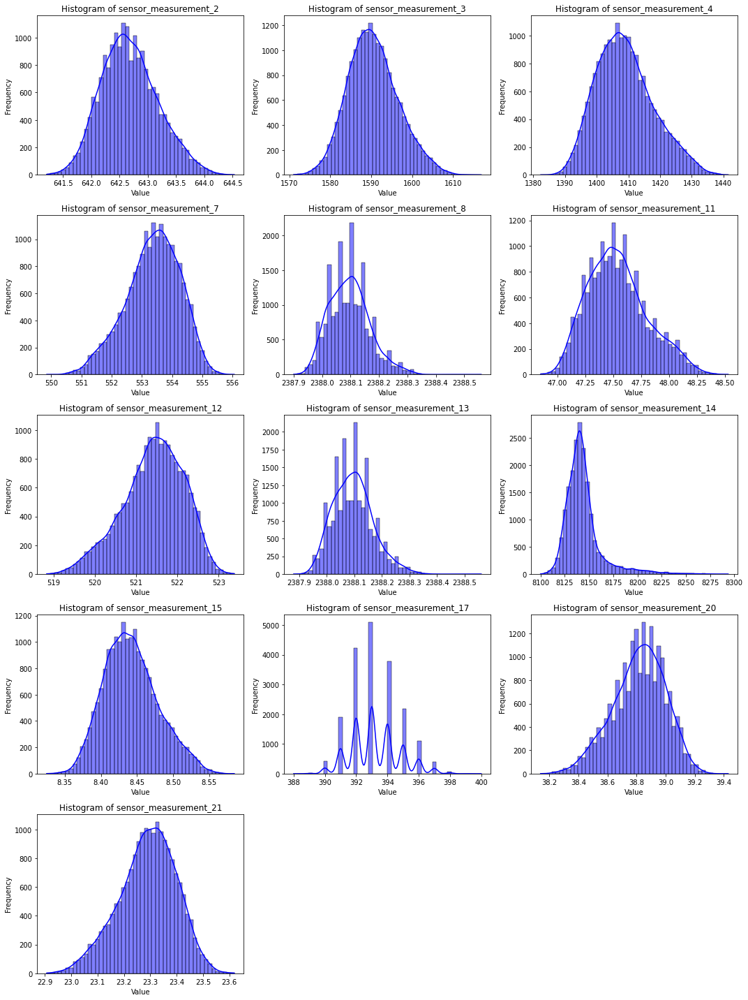

In [0]:
# Set up subplots: 3 histograms per row
num_sensors = len(selected_sensors)
rows = (num_sensors // 3) + (num_sensors % 3 > 0)  # Calculate required rows

plt.figure(figsize=(15, rows * 4))  # Adjust figure size

for i, sensor in enumerate(selected_sensors, 1):
    plt.subplot(rows, 3, i)  # Create subplots (3 per row)
    sns.histplot(train_fd_001_mod[sensor], bins=50, kde=True, color="blue")  # Histogram with KDE
    plt.title(f"Histogram of {sensor}")
    plt.xlabel("Value")
    plt.ylabel("Frequency")

# Adjust layout and show plots
plt.tight_layout()
plt.show()

1. sensor_measurement_8 and sensor_measurement_13
Highly skewed with an asymmetric distribution.
There is a clear peak with a long tail, suggesting possible sensor drift or different operational modes.
Action: Consider normalization or transformation (e.g., log transformation).
2. sensor_measurement_9 and sensor_measurement_14
Extreme right-skewness with values clustering on the lower end.
The long tail suggests potential outliers or a specific failure pattern.
Action: Investigate further with box plots or Z-score analysis.
3. sensor_measurement_17
The multi-peaked distribution (bimodal/multimodal) suggests different engine operating conditions.
Possible sensor noise or external interference.
Action: Check whether these peaks correspond to different failure modes.
4. sensor_measurement_12 and sensor_measurement_20
Show some level of skewness, but not as severe as the others.
Might benefit from scaling or standardization.

# WIP Train Data / Model

## Preparation Data for ML

In [0]:
train_fd_001.shape

Out[108]: (20631, 26)

In [0]:
train_fd_001_mod.shape

Out[109]: (19279, 16)

In [0]:
test_fd_001_mod.shape

Out[110]: (13096, 16)

### Feature Selection

In [0]:
print(train_fd_001_mod.columns)

Index(['unit_number', 'time_in_cycles', 'sensor_measurement_2',
       'sensor_measurement_3', 'sensor_measurement_4', 'sensor_measurement_7',
       'sensor_measurement_8', 'sensor_measurement_11',
       'sensor_measurement_12', 'sensor_measurement_13',
       'sensor_measurement_14', 'sensor_measurement_15',
       'sensor_measurement_17', 'sensor_measurement_20',
       'sensor_measurement_21', 'RUL'],
      dtype='object')


In [0]:
features = train_fd_001_mod.columns[2:-1]   # select only the sensor measurement columns
features 

Out[112]: Index(['sensor_measurement_2', 'sensor_measurement_3', 'sensor_measurement_4',
       'sensor_measurement_7', 'sensor_measurement_8', 'sensor_measurement_11',
       'sensor_measurement_12', 'sensor_measurement_13',
       'sensor_measurement_14', 'sensor_measurement_15',
       'sensor_measurement_17', 'sensor_measurement_20',
       'sensor_measurement_21'],
      dtype='object')

In [0]:
X = train_fd_001_mod[features]
y = train_fd_001_mod['RUL']

In [0]:
train_fd_001_mod['RUL']

Out[114]: 0        191
1        190
2        189
3        188
4        187
        ... 
19274      4
19275      3
19276      2
19277      1
19278      0
Name: RUL, Length: 19279, dtype: int64

- For the test data, which is also simulated, it is considered that the noise is consistently present in a similar manner, so I will for now stick to only standardize7scale the data and not apply additional 
- Scaling does NOT remove noise, but it can reduce its impact in certain ways; For future real data, if the noise is unpredictable, fluctuating, or significantly impacts model accuracy, additional noise-handling techniques may be needed (e.g., smoothing, clipping). 
- For the selected features, we have different distribution of sensor data: 
- For Normally Distributed Sensors (sensor_measurement_2, sensor_measurement_3, sensor_measurement_4, sensor_measurement_7, sensor_measurement_12, sensor_measurement_15, sensor_measurement_20, sensor_measurement_21) ->
These sensors appear to have a roughly Gaussian (bell-shaped) distribution. Hence I would use StandardScaler (centers data around 0, variance = 1).
- For Skewed or Noisy Sensors (sensor_measurement_8, sensor_measurement_11, sensor_measurement_13, sensor_measurement_14, sensor_measurement_1) -> These sensors show skewness or multimodal distribution (e.g., peaks or long tails), I would use RobustScaler or Log Transformation (more robust to outliers).

### Sensor Measurement Distribution if Standardization needed

In [0]:
# Standardize normally distributed sensors using StandardScaler.
# Normalize skewed/noisy sensors using RobustScaler.
# Split sensors based on distribution (from histogram analysis)
# sensor_measurement_17 has Discrete Values, so we will use the standardscaler
normal_sensors = ["sensor_measurement_2", "sensor_measurement_3", "sensor_measurement_4", "sensor_measurement_7", 
                  "sensor_measurement_12", "sensor_measurement_15", "sensor_measurement_17", "sensor_measurement_20", "sensor_measurement_21"]

# Use RobustScaler
skewed_sensors_1 = ["sensor_measurement_8", "sensor_measurement_11", "sensor_measurement_13"]

In [0]:
# UseMinMaxScaler 
skewed_sensors_2 = ["sensor_measurement_14"]

In [0]:
len(normal_sensors)

Out[117]: 9

In [0]:
# len(skewed_sensors)

In [0]:
len(selected_sensors)

Out[119]: 13

In [0]:
# len(normal_sensors) + len(skewed_sensors)

In [0]:
"""
# Combine normal_sensors and skewed_sensors
combined_sensors = normal_sensors + skewed_sensors

# Compare the lists
if set(combined_sensors) == set(selected_sensors):
    print("The elements match exactly.")
else:
    print("The elements do not match.")
    
#Optional: Check for missing or extra elements
missing = set(selected_sensors) - set(combined_sensors)
extra = set(combined_sensors) - set(selected_sensors)

if missing:
    print(f"Missing elements in combined list: {missing}")
if extra:
    print(f"Extra elements in combined list: {extra}")
"""

Out[163]: '\n# Combine normal_sensors and skewed_sensors\ncombined_sensors = normal_sensors + skewed_sensors\n\n# Compare the lists\nif set(combined_sensors) == set(selected_sensors):\n    print("The elements match exactly.")\nelse:\n    print("The elements do not match.")\n    \n#Optional: Check for missing or extra elements\nmissing = set(selected_sensors) - set(combined_sensors)\nextra = set(combined_sensors) - set(selected_sensors)\n\nif missing:\n    print(f"Missing elements in combined list: {missing}")\nif extra:\n    print(f"Extra elements in combined list: {extra}")\n'

In [0]:
df_train_scaled = X_train.copy()
# df_scaled.loc[:, columns_to_scale] = scaler.fit_transform(df_scaled[columns_to_scale])

In [0]:
# Exclude 'sensor_measurement_14'
# skewed_sensors_2 = [sensor for sensor in skewed_sensors if sensor != 'sensor_measurement_14']

In [0]:
# Apply StandardScaler to normally distributed sensors
scaler_standard = StandardScaler()
df_train_scaled.loc[:, normal_sensors] = scaler_standard.fit_transform(df_train_scaled[normal_sensors])

In [0]:
# Apply RobustScaler to skewed sensors (less sensitive to outliers)
scaler_robust = RobustScaler()
df_train_scaled.loc[:, skewed_sensors_1] = scaler_robust.fit_transform(df_train_scaled[skewed_sensors_1])

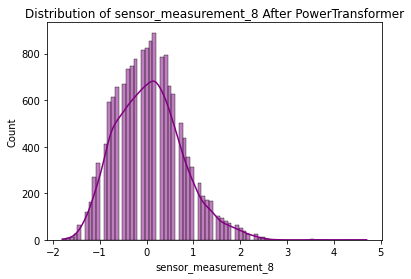

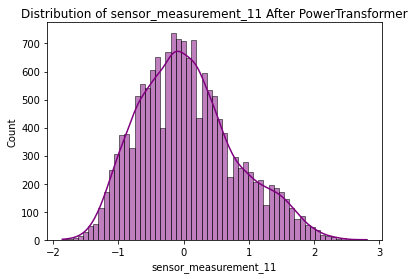

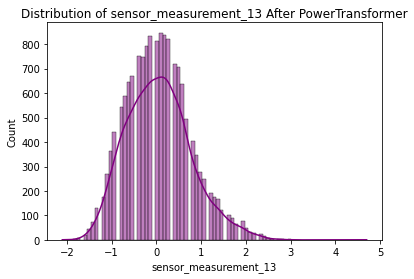

In [0]:
for col in skewed_sensors_1:
    plt.figure(figsize=(6, 4))
    sns.histplot(df_train_scaled[col], kde=True, color="purple")
    plt.title(f"Distribution of {col} After PowerTransformer")
    plt.show()

In [0]:
"""
# Instantiate PowerTransformer
power_transformer = PowerTransformer(method='yeo-johnson')  # Yeo-Johnson supports both positive & negative values

# Apply transformation to all skewed sensors
df_train_scaled[skewed_sensors_1] = power_transformer.fit_transform(df_train_scaled[skewed_sensors_1])

for col in skewed_sensors_1:
    plt.figure(figsize=(6, 4))
    sns.histplot(df_train_scaled[col], kde=True, color="purple")
    plt.title(f"Distribution of {col} After PowerTransformer")
    plt.show()
"""

Out[127]: '\n# Instantiate PowerTransformer\npower_transformer = PowerTransformer(method=\'yeo-johnson\')  # Yeo-Johnson supports both positive & negative values\n\n# Apply transformation to all skewed sensors\ndf_train_scaled[skewed_sensors_1] = power_transformer.fit_transform(df_train_scaled[skewed_sensors_1])\n\nfor col in skewed_sensors_1:\n    plt.figure(figsize=(6, 4))\n    sns.histplot(df_train_scaled[col], kde=True, color="purple")\n    plt.title(f"Distribution of {col} After PowerTransformer")\n    plt.show()\n'

In [0]:
"""
# from sklearn.preprocessing import PowerTransformer

# Instantiate PowerTransformer
power_transformer = PowerTransformer(method='yeo-johnson')  # Yeo-Johnson supports both positive & negative values

# Apply transformation to all skewed sensors
df_train_scaled[skewed_sensors] = power_transformer.fit_transform(df_train_scaled[skewed_sensors])

for col in skewed_sensors:
    plt.figure(figsize=(6, 4))
    sns.histplot(df_train_scaled[col], kde=True, color="purple")
    plt.title(f"Distribution of {col} After PowerTransformer")
    plt.show()
"""

Out[128]: '\n# from sklearn.preprocessing import PowerTransformer\n\n# Instantiate PowerTransformer\npower_transformer = PowerTransformer(method=\'yeo-johnson\')  # Yeo-Johnson supports both positive & negative values\n\n# Apply transformation to all skewed sensors\ndf_train_scaled[skewed_sensors] = power_transformer.fit_transform(df_train_scaled[skewed_sensors])\n\nfor col in skewed_sensors:\n    plt.figure(figsize=(6, 4))\n    sns.histplot(df_train_scaled[col], kde=True, color="purple")\n    plt.title(f"Distribution of {col} After PowerTransformer")\n    plt.show()\n'

- Sensor Measurement 17

The distribution is still highly discrete, with multiple spikes.
This suggests the original data had many repeated values.
Possible Cause: This feature might be categorical or have a very low number of unique values.

In [0]:
print(X_train['sensor_measurement_17'].nunique())

13


In [0]:
X_train['sensor_measurement_17'].unique() 

Out[170]: array([391, 398, 392, 390, 393, 394, 395, 396, 397, 389, 400, 388, 399])

In [0]:
print(test_fd_001['sensor_measurement_17'].nunique())

9


In [0]:
test_fd_001['sensor_measurement_17'].unique()

Out[133]: array([392, 393, 391, 390, 394, 395, 396, 389, 397])

In [0]:
# Apply StandardScaler to normally distributed sensors
#scaler_standard = StandardScaler()
#df_train_scaled.loc[:, normal_sensors] = scaler_standard.fit_transform(df_train_scaled[normal_sensors])

# Apply RobustScaler to skewed sensors (less sensitive to outliers)
#scaler_robust = RobustScaler()
#df_train_scaled.loc[:, skewed_sensors_2] = scaler_robust.fit_transform(df_train_scaled[skewed_sensors_2])

In [0]:
# Apply log transformation
# df_train_scaled['sensor_measurement_14'] = np.log1p(df_train_scaled['sensor_measurement_14'])  # log1p avoids log(0) errors

# Apply StandardScaler after log transformation
#scaler = StandardScaler()
#df_train_scaled['sensor_measurement_14'] = scaler.fit_transform(df_train_scaled[['sensor_measurement_14']])

In [0]:
# scaler = MinMaxScaler(feature_range=(0,1))
# X_train = scaler.fit_transform(X_train)      # fit on only train dataset
# X_test = scaler.transform(X_test)            # use same transofrmation , no fit_traansform
# X_val = scaler.transform(X_val)

In [0]:
# use MinMaxScaler (if values are within a fixed range, e.g., 0-1)
scaler = MinMaxScaler()
df_train_scaled[skewed_sensors_2] = scaler.fit_transform(df_train_scaled[skewed_sensors_2])

In [0]:
print("StandardScaler applied to normally distributed sensors:")
print(df_train_scaled[normal_sensors].describe())

print("\nRobustScaler applied to skewed sensors:")
print(df_train_scaled[skewed_sensors_1].describe())
print(df_train_scaled[skewed_sensors_2].describe())

StandardScaler applied to normally distributed sensors:
       sensor_measurement_2  sensor_measurement_3  sensor_measurement_4  \
count          1.542300e+04          1.542300e+04          1.542300e+04   
mean          -1.326070e-13         -3.347355e-14         -1.458771e-14   
std            1.000032e+00          1.000032e+00          1.000032e+00   
min           -2.930665e+00         -3.175053e+00         -2.955969e+00   
25%           -7.195503e-01         -6.954105e-01         -7.317157e-01   
50%           -8.211184e-02         -7.020848e-02         -8.767832e-02   
75%            6.549264e-01          6.298875e-01          6.282877e-01   
max            3.682759e+00          3.970811e+00          3.599491e+00   

       sensor_measurement_7  sensor_measurement_12  sensor_measurement_15  \
count          1.542300e+04           1.542300e+04           1.542300e+04   
mean           8.914379e-15          -6.061750e-14          -3.702765e-14   
std            1.000032e+00          

- 14

In [0]:
"""
# Before scaling
plt.figure(figsize=(6,4))
sns.histplot(X_train['sensor_measurement_14'], kde=True, color="blue")
plt.title("Original Distribution of sensor_measurement_14")
plt.show()

# After RobustScaler
plt.figure(figsize=(6,4))
sns.histplot(df_train_scaled['sensor_measurement_14'], kde=True, color="green")
plt.title("Distribution of sensor_measurement_14 After RobustScaler")
plt.show()
"""

Out[138]: '\n# Before scaling\nplt.figure(figsize=(6,4))\nsns.histplot(X_train[\'sensor_measurement_14\'], kde=True, color="blue")\nplt.title("Original Distribution of sensor_measurement_14")\nplt.show()\n\n# After RobustScaler\nplt.figure(figsize=(6,4))\nsns.histplot(df_train_scaled[\'sensor_measurement_14\'], kde=True, color="green")\nplt.title("Distribution of sensor_measurement_14 After RobustScaler")\nplt.show()\n'

In [0]:
"""
# Apply log transformation
df_train_scaled['sensor_measurement_14'] = np.log1p(df_train_scaled['sensor_measurement_14'])  # log1p avoids log(0) errors

# Apply StandardScaler after log transformation
scaler = StandardScaler()
df_train_scaled['sensor_measurement_14'] = scaler.fit_transform(df_train_scaled[['sensor_measurement_14']])
"""

Out[139]: "\n# Apply log transformation\ndf_train_scaled['sensor_measurement_14'] = np.log1p(df_train_scaled['sensor_measurement_14'])  # log1p avoids log(0) errors\n\n# Apply StandardScaler after log transformation\nscaler = StandardScaler()\ndf_train_scaled['sensor_measurement_14'] = scaler.fit_transform(df_train_scaled[['sensor_measurement_14']])\n"

In [0]:
"""
plt.figure(figsize=(6,4))
sns.histplot(df_train_scaled['sensor_measurement_14'], kde=True, color="green")
plt.title("Distribution of sensor_measurement_14 After RobustScaler")
plt.show()
"""

Out[140]: '\nplt.figure(figsize=(6,4))\nsns.histplot(df_train_scaled[\'sensor_measurement_14\'], kde=True, color="green")\nplt.title("Distribution of sensor_measurement_14 After RobustScaler")\nplt.show()\n'

In [0]:
"""
# Before scaling (assuming df_train contains original values)
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
sns.histplot(X_train[normal_sensors[0]], ax=axes[0], kde=True, color="blue")
sns.histplot(df_train_scaled[normal_sensors[0]], ax=axes[1], kde=True, color="green")
axes[0].set_title("Before Scaling (Normal Sensor)")
axes[1].set_title("After Scaling (Normal Sensor)")
plt.show()
"""

Out[141]: '\n# Before scaling (assuming df_train contains original values)\nfig, axes = plt.subplots(1, 2, figsize=(12, 5))\nsns.histplot(X_train[normal_sensors[0]], ax=axes[0], kde=True, color="blue")\nsns.histplot(df_train_scaled[normal_sensors[0]], ax=axes[1], kde=True, color="green")\naxes[0].set_title("Before Scaling (Normal Sensor)")\naxes[1].set_title("After Scaling (Normal Sensor)")\nplt.show()\n'

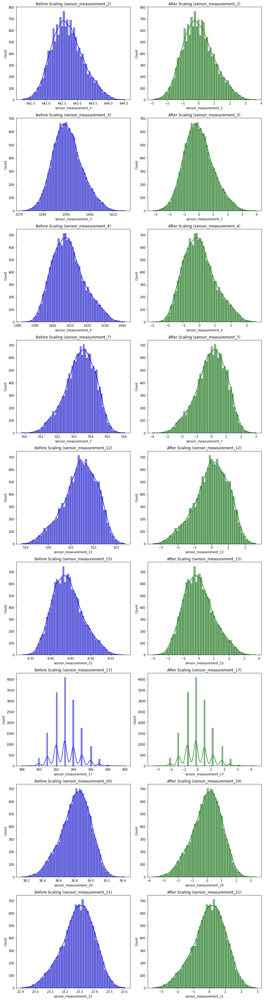

In [0]:
# Define the number of sensors
num_sensors = len(normal_sensors)

# Create subplots dynamically
fig, axes = plt.subplots(num_sensors, 2, figsize=(12, 5 * num_sensors))

# Loop through each sensor and plot before and after scaling
for i, sensor in enumerate(normal_sensors):
    sns.histplot(X_train[sensor], ax=axes[i, 0], kde=True, color="blue")
    sns.histplot(df_train_scaled[sensor], ax=axes[i, 1], kde=True, color="green")
    
    axes[i, 0].set_title(f"Before Scaling ({sensor})")
    axes[i, 1].set_title(f"After Scaling ({sensor})")

# Adjust layout for better spacing
plt.tight_layout()
plt.show()

In [0]:
"""
# Define the number of sensors
num_sensors = len(skewed_sensors)

# Create subplots dynamically
fig, axes = plt.subplots(num_sensors, 2, figsize=(12, 5 * num_sensors))

# Loop through each sensor and plot before and after scaling
for i, sensor in enumerate(skewed_sensors):
    sns.histplot(X_train[sensor], ax=axes[i, 0], kde=True, color="blue")
    sns.histplot(df_train_scaled[sensor], ax=axes[i, 1], kde=True, color="green")
    
    axes[i, 0].set_title(f"Before Scaling ({sensor})")
    axes[i, 1].set_title(f"After Scaling ({sensor})")

# Adjust layout for better spacing
plt.tight_layout()
plt.show()
"""

Out[143]: '\n# Define the number of sensors\nnum_sensors = len(skewed_sensors)\n\n# Create subplots dynamically\nfig, axes = plt.subplots(num_sensors, 2, figsize=(12, 5 * num_sensors))\n\n# Loop through each sensor and plot before and after scaling\nfor i, sensor in enumerate(skewed_sensors):\n    sns.histplot(X_train[sensor], ax=axes[i, 0], kde=True, color="blue")\n    sns.histplot(df_train_scaled[sensor], ax=axes[i, 1], kde=True, color="green")\n    \n    axes[i, 0].set_title(f"Before Scaling ({sensor})")\n    axes[i, 1].set_title(f"After Scaling ({sensor})")\n\n# Adjust layout for better spacing\nplt.tight_layout()\nplt.show()\n'

In [0]:
"""
# Before scaling (assuming df_train contains original values)
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
sns.histplot(X_train[skewed_sensors[0]], ax=axes[0], kde=True, color="blue")
sns.histplot(df_train_scaled[skewed_sensors[0]], ax=axes[1], kde=True, color="green")
axes[0].set_title("Before Scaling (Normal Sensor)")
axes[1].set_title("After Scaling (Normal Sensor)")
plt.show()
"""

Out[144]: '\n# Before scaling (assuming df_train contains original values)\nfig, axes = plt.subplots(1, 2, figsize=(12, 5))\nsns.histplot(X_train[skewed_sensors[0]], ax=axes[0], kde=True, color="blue")\nsns.histplot(df_train_scaled[skewed_sensors[0]], ax=axes[1], kde=True, color="green")\naxes[0].set_title("Before Scaling (Normal Sensor)")\naxes[1].set_title("After Scaling (Normal Sensor)")\nplt.show()\n'

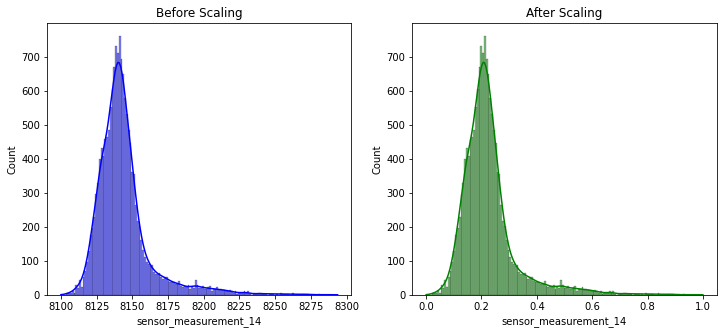

In [0]:
# Before scaling (assuming df_train contains original values)
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
sns.histplot(X_train[skewed_sensors_2[0]], ax=axes[0], kde=True, color="blue")
sns.histplot(df_train_scaled[skewed_sensors_2[0]], ax=axes[1], kde=True, color="green")
axes[0].set_title("Before Scaling")
axes[1].set_title("After Scaling")
plt.show() 

In [0]:
"""
# Define the number of sensors
num_sensors = len(skewed_sensors_2)

# Create subplots dynamically
fig, axes = plt.subplots(num_sensors, 2, figsize=(12, 5 * num_sensors))

# Loop through each sensor and plot before and after scaling
for i, sensor in enumerate(skewed_sensors_2):
    sns.histplot(X_train[sensor], ax=axes[i, 0], kde=True, color="blue")
    sns.histplot(df_train_scaled[sensor], ax=axes[i, 1], kde=True, color="green")
    
    axes[i, 0].set_title(f"Before Scaling ({sensor})")
    axes[i, 1].set_title(f"After Scaling ({sensor})")

# Adjust layout for better spacing
plt.tight_layout()
plt.show()
"""

Out[147]: '\n# Define the number of sensors\nnum_sensors = len(skewed_sensors_2)\n\n# Create subplots dynamically\nfig, axes = plt.subplots(num_sensors, 2, figsize=(12, 5 * num_sensors))\n\n# Loop through each sensor and plot before and after scaling\nfor i, sensor in enumerate(skewed_sensors_2):\n    sns.histplot(X_train[sensor], ax=axes[i, 0], kde=True, color="blue")\n    sns.histplot(df_train_scaled[sensor], ax=axes[i, 1], kde=True, color="green")\n    \n    axes[i, 0].set_title(f"Before Scaling ({sensor})")\n    axes[i, 1].set_title(f"After Scaling ({sensor})")\n\n# Adjust layout for better spacing\nplt.tight_layout()\nplt.show()\n'

#### Check Null values after Standardization

In [0]:
print(df_train_scaled.isna().sum())

sensor_measurement_2     0
sensor_measurement_3     0
sensor_measurement_4     0
sensor_measurement_7     0
sensor_measurement_8     0
sensor_measurement_11    0
sensor_measurement_12    0
sensor_measurement_13    0
sensor_measurement_14    0
sensor_measurement_15    0
sensor_measurement_17    0
sensor_measurement_20    0
sensor_measurement_21    0
dtype: int64


- First we test Random Forest, since we do have some "abnormal" sensor measurements

## Data Split

In [0]:
X_train , X_test , y_train , y_test = train_test_split(X, y, test_size=0.2 , random_state=42)

In [0]:
X_train.shape, X_test.shape

Out[196]: ((15423, 13), (3856, 13))

In [0]:
len(y_test)

Out[197]: 3856

In [0]:
y.nunique()

Out[198]: 293

# Supervised Learning

## Random Forest

- For this methode we don't have to standardize the data

In [0]:
model_random_forest = RandomForestRegressor(n_estimators=100, random_state=42)
model_random_forest.fit(X_train, y_train)

Out[199]: RandomForestRegressor(random_state=42)

In [0]:
"""
def metrics(y_true , y_pred , label = 'train'):
    '''evaluate model , by taking y_true , y_pred and label of dataset'''
    
    rmse = root_mean_squared_error(y_true , y_pred)
    r2 = r2_score(y_true , y_pred)
    print(f'for {label} set , RMSE = {rmse:0.2f} , r2_score = {r2*100:0.2f}%')

In [0]:
X_test

,sensor_measurement_2,sensor_measurement_3,sensor_measurement_4,sensor_measurement_7,sensor_measurement_8,sensor_measurement_11,sensor_measurement_12,sensor_measurement_13,sensor_measurement_14,sensor_measurement_15,sensor_measurement_17,sensor_measurement_20,sensor_measurement_21
18665,642.53,1591.38,1409.07,554.10,2388.09,47.46,521.82,2388.09,8148.43,8.4327,393,38.83,23.3932
10901,642.54,1590.64,1408.19,553.30,2388.10,47.42,521.61,2388.03,8148.85,8.4055,394,38.94,23.3777
351,642.53,1585.65,1409.72,554.65,2388.07,47.46,521.96,2388.05,8144.03,8.4012,393,38.92,23.4119
2408,642.41,1589.35,1406.30,553.10,2388.06,47.51,521.33,2388.08,8123.56,8.4577,393,38.94,23.3029
9020,642.81,1596.51,1415.17,553.06,2388.18,47.71,521.12,2388.18,8134.02,8.4700,395,38.55,23.2365
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6306,643.06,1585.69,1408.53,553.16,2388.15,47.73,521.57,2388.15,8133.36,8.4214,394,38.64,23.2206
3115,642.82,1586.98,1409.82,553.22,2388.16,47.64,521.25,2388.14,8134.17,8.4321,393,38.77,23.2288
18772,642.49,1584.26,1394.32,554.38,2387.94,47.31,522.37,2387.98,8150.64,8.3912,392,39.09,23.4646
5199,642.48,1586.98,1414.15,553.53,2388.11,47.61,521.64,2388.16,8134.88,8.5059,393,38.83,23.2848


In [0]:
X_test.columns

Out[212]: Index(['sensor_measurement_2', 'sensor_measurement_3', 'sensor_measurement_4',
       'sensor_measurement_7', 'sensor_measurement_8', 'sensor_measurement_11',
       'sensor_measurement_12', 'sensor_measurement_13',
       'sensor_measurement_14', 'sensor_measurement_15',
       'sensor_measurement_17', 'sensor_measurement_20',
       'sensor_measurement_21'],
      dtype='object')

In [0]:
# Assuming test_fd_001 and X_test are already defined as Pandas DataFrames
filtered_test_fd_001 = test_fd_001[X_test.columns].copy()

# Display the copied DataFrame
print(filtered_test_fd_001.head())

   sensor_measurement_2  sensor_measurement_3  sensor_measurement_4  \
0                643.02               1585.29               1398.21   
1                641.71               1588.45               1395.42   
2                642.46               1586.94               1401.34   
3                642.44               1584.12               1406.42   
4                642.51               1587.19               1401.92   

   sensor_measurement_7  sensor_measurement_8  sensor_measurement_11  \
0                553.90               2388.04                  47.20   
1                554.85               2388.01                  47.50   
2                554.11               2388.05                  47.50   
3                554.07               2388.03                  47.28   
4                554.16               2388.01                  47.31   

   sensor_measurement_12  sensor_measurement_13  sensor_measurement_14  \
0                 521.72                2388.03                812

In [0]:
# Predictions & RMSE for regression
y_pred = model_random_forest.predict(X_test)
rmse = mean_squared_error(y_test, y_pred, squared=False)
print(f"Random Forest Regression RMSE: {rmse}")

Random Forest Regression RMSE: 35.961425879277186


In [0]:
len(y_pred)

Out[185]: 15423

In [0]:
y_pred_for_train = model_random_forest.predict(X_train)
rmse = mean_squared_error(y_train, y_pred_for_train, squared=False)
print(f"Random Forest Regression RMSE: {rmse}")

Random Forest Regression RMSE: 13.732130635396313


In [0]:
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, y_pred)
print(f"MAE: {mae:.4f}")

MAE: 26.0969


In [0]:
min(y)

Out[154]: 0

In [0]:
max(y)

Out[155]: 292

If y ranges from 0 to 100, then 35.96 is high.
If y ranges from 1000 to 10000, then 35.96 might be acceptable.

In [0]:
# mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100
# print(f"MAPE: {mape:.2f}%")

MAPE: inf%


In [0]:
# print("Number of zero values in y_test:", (y_test == 0).sum())

Number of zero values in y_test: 23


In [0]:
y_pred

Out[207]: array([ 98.74,  86.32, 138.99, ..., 172.51, 120.62, 205.78])

## Hyperparameter Tuning (Grid Search)

In [0]:
from sklearn.model_selection import GridSearchCV

In [0]:
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt']
}

rf = RandomForestRegressor(random_state=42) # , n_jobs=-1
grid_search = GridSearchCV(rf, param_grid, cv=3, scoring='neg_mean_absolute_error', verbose=2) # n_jobs=-1
grid_search.fit(X_train, y_train)

# Get best model
best_model = grid_search.best_estimator_
y_pred_best = best_model.predict(X_test)
mae_best = mean_absolute_error(y_test, y_pred_best)

print(f"Optimized Random Forest MAE: {mae_best:.4f}")

Fitting 3 folds for each of 162 candidates, totalling 486 fits
[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   5.1s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   5.3s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   5.2s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=  10.3s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=  10.5s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=  10.3s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=300; total time=  15.5s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=3

## TODO Other Methods: SVM, XGBoosting?

# TODO Compare with real RUL

# TODO Model Evaluation of all